In [1]:
import glob
import math
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import random
import sklearn.metrics as metrics

from tensorflow.keras import optimizers
from tensorflow.keras import backend
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, LearningRateScheduler
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import add, concatenate, Conv2D, Dense, Dropout, Flatten, Input, Lambda
from tensorflow.keras.layers import Activation, AveragePooling2D, BatchNormalization, MaxPooling2D, ZeroPadding2D
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical


%matplotlib inline

In [2]:
                            # Set up 'ggplot' style
plt.style.use('ggplot')     # if want to use the default style, set 'classic'
plt.rcParams['ytick.right']     = True
plt.rcParams['ytick.labelright']= True
plt.rcParams['ytick.left']      = False
plt.rcParams['ytick.labelleft'] = False
plt.rcParams['font.family']     = 'Arial'

In [3]:
# where am i?
%pwd

'C:\\Users\\david\\Documents\\ImageNet'

In [4]:
%ls

 Volume in drive C is Acer
 Volume Serial Number is F2E5-64E8

 Directory of C:\Users\david\Documents\ImageNet

09/16/2019  06:31 AM    <DIR>          .
09/16/2019  06:31 AM    <DIR>          ..
09/09/2019  01:02 AM                43 .gitattributes
08/22/2019  11:06 PM                26 .gitignore
09/15/2019  02:47 PM    <DIR>          .ipynb_checkpoints
09/14/2019  04:34 PM         1,216,519 Create_Train_Test_Set.ipynb
09/14/2019  03:53 PM    <DIR>          data
08/22/2019  11:09 PM           455,126 Download-ImageNet.html
09/09/2019  12:35 AM           288,923 Download-ImageNet.ipynb
09/03/2019  09:40 PM           367,769 Download-Pexels.html
09/09/2019  12:35 AM            94,549 Download-Pexels.ipynb
09/09/2019  01:02 AM        10,518,772 fgs-imgs.npz
09/08/2019  11:18 PM        41,976,052 fgs-imgs128.npz
09/08/2019  11:18 PM        23,611,636 fgs-imgs96.npz
09/14/2019  03:57 PM        49,130,740 fgsOpnImg-imgs96.npz
09/16/2019  06:28 AM            14,880 FlowerPower.csv
09/16/2019

In [5]:
flowers = glob.glob('./data/flr_*.jpg')
fungus = glob.glob('./data/fgs_*.jpg')
rocks = glob.glob('./data/rck_*.jpg')

pixel_flowers = glob.glob('./data/pxl_flower_*.jpeg')
pixel_umbrella = glob.glob('./data/pxl_umbrella_*.jpeg')
print("There are %s, %s flower, %s fungus, %s rock and %s umbrella pictures" %(len(flowers), len(pixel_flowers), len(fungus), len(rocks), len(pixel_umbrella)))

There are 1269, 1792 flower, 856 fungus, 1007 rock and 420 umbrella pictures


Showing: ./data\flr_01149.jpg


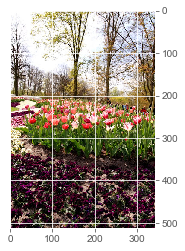

Showing: ./data\flr_01639.jpg


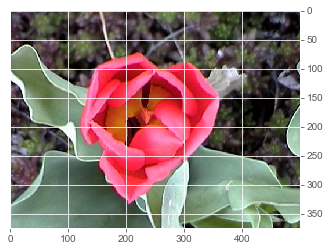

Showing: ./data\flr_00363.jpg


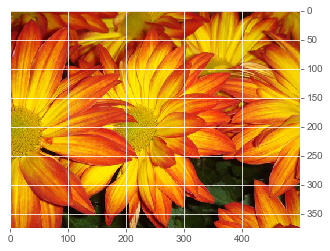

Showing: ./data\flr_01880.jpg


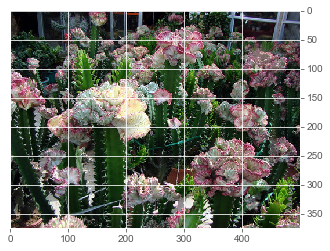

Showing: ./data\flr_01680.jpg


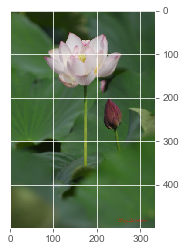

In [6]:
# Randomly show 10 examples of the images
from IPython.display import Image
    
dataset = flowers #flowers #fungus #rocks

for i in range(0, 5):
    index = random.randint(0, len(dataset)-1)   
    print("Showing:", dataset[index])
    
    img = mpimg.imread(dataset[index])
    imgplot = plt.imshow(img)
    plt.show()

#Image(dataset[index])

# Extract the training and testing datasets

In [7]:
# Load the data
trDatOrg       = np.load('flrnonflr-train-imgs96-0.8+.npz')['arr_0']
trLblOrg       = np.load('flrnonflr-train-labels96-0.8+.npz')['arr_0']
tsDatOrg       = np.load('flrnonflr-test-imgs96-0.8+.npz')['arr_0']
tsLblOrg       = np.load('flrnonflr-test-labels96-0.8+.npz')['arr_0']

In [8]:
print("For the training and test datasets:")
print("The shapes are %s, %s, %s, %s" \
      %(trDatOrg.shape, trLblOrg.shape, tsDatOrg.shape, tsLblOrg.shape))

For the training and test datasets:
The shapes are (14784, 96, 96, 3), (14784,), (3696, 96, 96, 3), (3696,)


Showing 2132 index image, It is 1.0


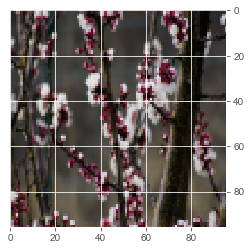

Showing 2446 index image, It is 0.0


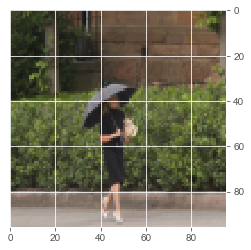

Showing 2733 index image, It is 0.0


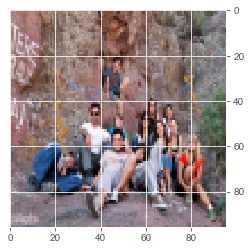

Showing 2795 index image, It is 0.0


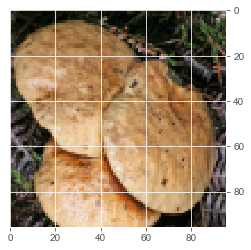

Showing 2361 index image, It is 0.0


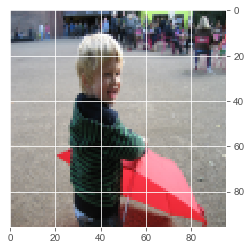

Showing 1673 index image, It is 1.0


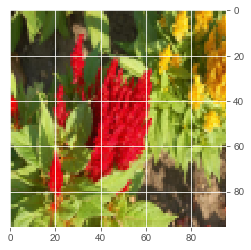

Showing 1502 index image, It is 1.0


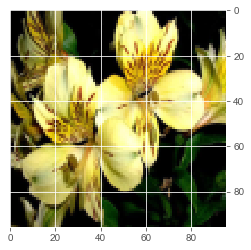

Showing 3005 index image, It is 0.0


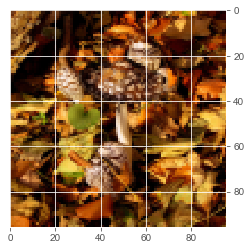

Showing 2014 index image, It is 1.0


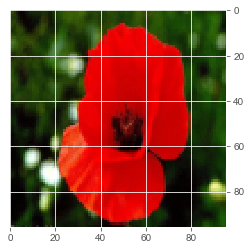

Showing 2768 index image, It is 0.0


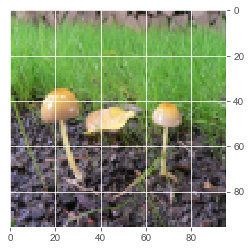

Showing 3574 index image, It is 0.0


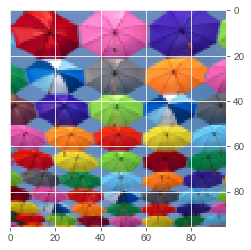

Showing 746 index image, It is 1.0


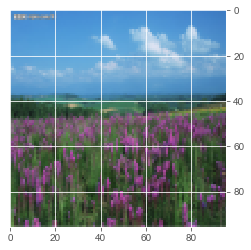

Showing 603 index image, It is 1.0


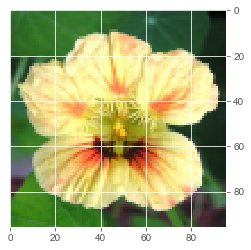

Showing 1780 index image, It is 1.0


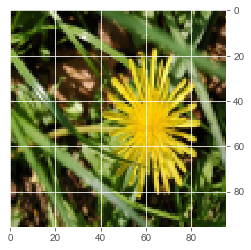

Showing 1891 index image, It is 1.0


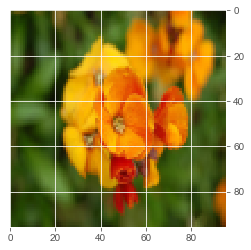

Showing 1085 index image, It is 1.0


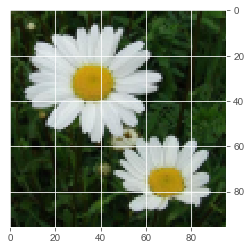

Showing 2683 index image, It is 0.0


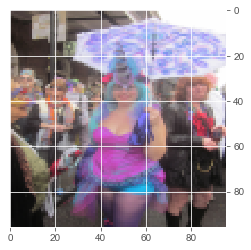

Showing 3330 index image, It is 0.0


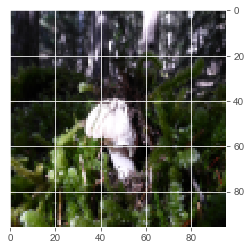

Showing 1202 index image, It is 1.0


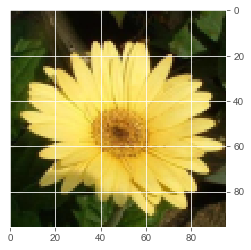

Showing 357 index image, It is 1.0


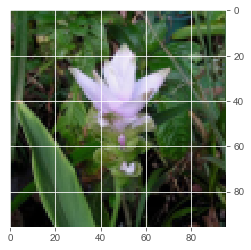

In [9]:
# Randomly show 10 examples of the images

data = tsDatOrg
label = tsLblOrg

for i in range(20):
    index = random.randint(0, len(data)-1)
    print("Showing %s index image, It is %s" %(index, label[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

In [10]:
# Convert the data into 'float32'
# Rescale the values from 0~255 to 0~1
trDat       = trDatOrg.astype('float32')/255
tsDat       = tsDatOrg.astype('float32')/255

# Retrieve the row size of each image
# Retrieve the column size of each image
imgrows     = trDat.shape[1]
imgclms     = trDat.shape[2]
channel     = 3

# # reshape the data to be [samples][width][height][channel]
# # This is required by Keras framework
# trDat       = trDat.reshape(trDat.shape[0], imgrows, imgclms, channel)
# tsDat       = tsDat.reshape(tsDat.shape[0], imgrows, imgclms, channel)

# Perform one hot encoding on the labels
# Retrieve the number of classes in this problem
trLbl       = to_categorical(trLblOrg)
tsLbl       = to_categorical(tsLblOrg)
num_classes = tsLbl.shape[1]

In [11]:
# fix random seed for reproducibility
seed = 29
np.random.seed(seed)


modelname = 'FlowerPower'

#optmz = optimizers.Adam(lr=0.001)
optmz = optimizers.RMSprop(lr=0.001)

In [12]:
# Baseline Model -> func: createBaselineModel()

def createBaselineModel():
    inputs = Input(shape=(imgrows, imgclms, channel))
    x = Conv2D(30, (4, 4), activation='relu')(inputs)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Conv2D(50, (4, 4), activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dense(32, activation='relu')(x)
    x = Dense(num_classes, activation='softmax')(x)
    
    model = Model(inputs=[inputs],outputs=x)
    
    model.compile(loss='categorical_crossentropy', 
                  optimizer='adam',
                  metrics=['accuracy'])
    return model

In [13]:
# ResNetV1 -> func: createResNetV1()
def resLyr(inputs,
           numFilters=16,
           kernelSz=3,
           strides=1,
           activation='relu',
           batchNorm=True,
           convFirst=True,
           lyrName=None):
    convLyr = Conv2D(numFilters, kernel_size=kernelSz, strides=strides, 
                     padding='same', kernel_initializer='he_normal', 
                     kernel_regularizer=l2(1e-4), 
                     name=lyrName+'_conv' if lyrName else None)
    x = inputs
    if convFirst:
        x = convLyr(x)
        if batchNorm:
            x = BatchNormalization(name=lyrName+'_bn' if lyrName else None)(x)
        if activation is not None:
            x = Activation(activation,name=lyrName+'_'+activation if lyrName else None)(x)
    else:
        if batchNorm:
            x = BatchNormalization(name=lyrName+'_bn' if lyrName else None)(x)
        if activation is not None:
            x = Activation(activation, name=lyrName+'_'+activation if lyrName else None)(x)
        x = convLyr(x)
    return x


def resBlkV1(inputs,
             numFilters=16,
             numBlocks=3,
             downsampleOnFirst=True,
             names=None):
    x = inputs
    for run in range(0,numBlocks):
        strides = 1
        blkStr = str(run+1)
        if downsampleOnFirst and run == 0:
            strides = 2
        y = resLyr(inputs=x, numFilters=numFilters, strides=strides,
                   lyrName=names+'_Blk'+blkStr+'_Res1' if names else None)
        y = resLyr(inputs=y, numFilters=numFilters, activation=None,
                   lyrName=names+'_Blk'+blkStr+'_Res2' if names else None)
        if downsampleOnFirst and run == 0:
            x = resLyr(inputs=x, numFilters=numFilters, kernelSz=1,
                       strides=strides, activation=None, batchNorm=False,
                       lyrName=names+'_Blk'+blkStr+'_lin' if names else None)
        x = add([x,y], name=names+'_Blk'+blkStr+'_add' if names else None)
        x = Activation('relu', name=names+'_Blk'+blkStr+'_relu' if names else None)(x)
    return x

def createResNetV1(inputShape=(imgrows, imgclms, channel),
                   numClasses=2):
    inputs = Input(shape=inputShape)
    v = resLyr(inputs, lyrName='Inpt')
    v = resBlkV1(inputs=v, numFilters=16, numBlocks=3,
                 downsampleOnFirst=False, names='Stg1')
    v = Dropout(0.30)(v)
    v = resBlkV1(inputs=v, numFilters=32, numBlocks=3,
                 downsampleOnFirst=True, names='Stg2')
    v = Dropout(0.40)(v)
    v = resBlkV1(inputs=v, numFilters=64, numBlocks=3,
                 downsampleOnFirst=True, names='Stg3')
    v = Dropout(0.50)(v)
    v = resBlkV1(inputs=v, numFilters=128, numBlocks=3,
                 downsampleOnFirst=True, names='Stg4')
    v = Dropout(0.50)(v)
    v = resBlkV1(inputs=v, numFilters=128, numBlocks=3,
                 downsampleOnFirst=False, names='Stg5')
    v = Dropout(0.50)(v)
    v = resBlkV1(inputs=v, numFilters=256, numBlocks=3,
                 downsampleOnFirst=True, names='Stg6')
    v = Dropout(0.50)(v)
    v = AveragePooling2D(pool_size=6, name='AvgPool')(v)
    v = Flatten()(v) 
    outputs = Dense(numClasses, activation='softmax', 
                    kernel_initializer='he_normal')(v)
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer=optmz, 
                  metrics=['accuracy'])
    return model

In [14]:
# Mostly Original # Inception-v4 -> func: create_inception_v4()

def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    x_R2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=64, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=64, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_a_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_2)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_2, x_ER1_3])
    return x

def inception_b_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=224, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_1)
    x_MR1_3 = Conv2D(filters=256, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_2)
    
    x_ER1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=192, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=224, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_4 = Conv2D(filters=224, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_3)
    x_ER1_5 = Conv2D(filters=256, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_4)

    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_3, x_ER1_5])
    return x

def inception_c_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_1_L2 = Conv2D(filters=256, kernel_size=(1, 3), strides=1, padding='same')(x_MR1_1)
    x_MR1_1_R2 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=448, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=512, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_3_L1 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_3)
    x_ER1_3_R1 = Conv2D(filters=256, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_3)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_1_L2, x_MR1_1_R2, x_ER1_3_L1, x_ER1_3_R1])
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 192, 224, 256, 384
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 192, 192, 256, 384
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 256, 256, 384, 384
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def reduction_b_block(inputs,
                      names=None):

        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x_M_1)
    
    x_R_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=256, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=320, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    x_R_4 = Conv2D(filters=320, kernel_size=(3, 3), strides=2, padding='valid')(x_R_3)
    
    x = concatenate([x_L_1, x_M_2, x_R_4])
    return x

def create_inception_v4(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-v4"
    inputs = Input(shape=inputShape)
    x = stem_block(inputs)
    x = inception_a_block(x)
    x = inception_a_block(x)
    x = inception_a_block(x)
    x = inception_a_block(x)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = inception_b_block(x)
    x = reduction_b_block(x)
    
    x = inception_c_block(x)
    x = inception_c_block(x)
    x = inception_c_block(x)
    
    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(1536)(x) # Changed
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer="Adam", 
                  metrics=['accuracy'])
    return model

In [15]:
# Modified2 # Inception-v4 -> func: create_inception_v4()

def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    x_R2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=64, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=64, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_a_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_2)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_2, x_ER1_3])
    return x

def inception_b_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=224, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_1)
    x_MR1_3 = Conv2D(filters=256, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_2)
    
    x_ER1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=192, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=224, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_4 = Conv2D(filters=224, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_3)
    x_ER1_5 = Conv2D(filters=256, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_4)

    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_3, x_ER1_5])
    return x

def inception_c_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_1_L2 = Conv2D(filters=256, kernel_size=(1, 3), strides=1, padding='same')(x_MR1_1)
    x_MR1_1_R2 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=384, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=448, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=512, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_3_L1 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_3)
    x_ER1_3_R1 = Conv2D(filters=256, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_3)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_1_L2, x_MR1_1_R2, x_ER1_3_L1, x_ER1_3_R1])
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 192, 224, 256, 384
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 192, 192, 256, 384
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 256, 256, 384, 384
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def reduction_b_block(inputs,
                      names=None):

        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x_M_1)
    
    x_R_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=256, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=320, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    x_R_4 = Conv2D(filters=320, kernel_size=(3, 3), strides=2, padding='valid')(x_R_3)
    
    x = concatenate([x_L_1, x_M_2, x_R_4])
    return x

def create_inception_v4(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-v4"
    inputs = Input(shape=inputShape)
    x = stem_block(inputs)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = reduction_b_block(x)
    
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    
    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(1536)(x) # Changed
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer="Adam", 
                  metrics=['accuracy'])
    return model

In [16]:
# Modified #(halfed) # Inception-v4 -> func: create_inception_v4()

def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=16, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=16, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=48, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    x_R2_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=32, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=32, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_a_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=48, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=48, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_ER1_2)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_2, x_ER1_3])
    return x

def inception_b_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_2 = Conv2D(filters=112, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_1)
    x_MR1_3 = Conv2D(filters=128, kernel_size=(1, 7), strides=1, padding='same')(x_MR1_2)
    
    x_ER1_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=96, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=112, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_4 = Conv2D(filters=112, kernel_size=(1, 7), strides=1, padding='same')(x_ER1_3)
    x_ER1_5 = Conv2D(filters=128, kernel_size=(7, 1), strides=1, padding='same')(x_ER1_4)

    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_3, x_ER1_5])
    return x

def inception_c_block(inputs,
         names=None):
    x = inputs
    
    x_EL1_1 = AveragePooling2D(pool_size=(1, 1), padding='same')(x)
    x_EL1_2 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x_EL1_1)
    
    x_ML1_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_MR1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR1_1_L2 = Conv2D(filters=128, kernel_size=(1, 3), strides=1, padding='same')(x_MR1_1)
    x_MR1_1_R2 = Conv2D(filters=128, kernel_size=(3, 1), strides=1, padding='same')(x_MR1_1)
    
    x_ER1_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER1_2 = Conv2D(filters=224, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_1)
    x_ER1_3 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_2)
    x_ER1_3_L1 = Conv2D(filters=128, kernel_size=(3, 1), strides=1, padding='same')(x_ER1_3)
    x_ER1_3_R1 = Conv2D(filters=128, kernel_size=(1, 3), strides=1, padding='same')(x_ER1_3)
    
    x = concatenate([x_EL1_2, x_ML1_1, x_MR1_1_L2, x_MR1_1_R2, x_ER1_3_L1, x_ER1_3_R1])
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 96, 112, 128, 192
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 96, 96, 128, 192
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 128, 128, 192, 192
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def reduction_b_block(inputs,
                      names=None):

        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=96, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x_M_1)
    
    x_R_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=128, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=160, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    x_R_4 = Conv2D(filters=160, kernel_size=(3, 3), strides=2, padding='valid')(x_R_3)
    
    x = concatenate([x_L_1, x_M_2, x_R_4])
    return x

def create_inception_v4(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-v4"
    inputs = Input(shape=inputShape)
    x = stem_block(inputs)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = inception_a_block(x)
    x = BatchNormalization()(x)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = inception_b_block(x)
    x = BatchNormalization()(x)
    x = reduction_b_block(x)
    
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = inception_c_block(x)
    x = BatchNormalization()(x)
    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(256)(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer=optmz, 
                  metrics=['accuracy'])
    return model 

In [17]:
# Mostly Original # Inception-Res-v2 -> func: create_inception_resnet_v2()
def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    
    x_R2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=64, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=64, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_resnet_v2_a_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs
    
    x_L_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_M_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='same')(x_M_1)
    
    x_R_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_M_2, x_R_3])
    x_C_2 = Conv2D(filters=384, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_b_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=160, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=192, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=1152, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)

    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_c_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=224, kernel_size=(1, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=2048, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 192, 224, 256, 384
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 192, 192, 256, 384
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 256, 256, 384, 384
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def inception_resnet_v2_reduction_b_block(inputs,
                      names=None):   
    x = inputs
    
    x_EL_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_ML_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ML_2 = Conv2D(filters=384, kernel_size=(3, 3), strides=2, padding='valid')(x_ML_1)
    
    x_MR_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR_2 = Conv2D(filters=256, kernel_size=(3, 3), strides=2, padding='valid')(x_MR_1)
    
    x_ER_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER_2 = Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding='same')(x_ER_1)
    x_ER_3 = Conv2D(filters=256, kernel_size=(3, 3), strides=2, padding='valid')(x_ER_2)
    
    x = concatenate([x_EL_1, x_ML_2, x_MR_2, x_ER_3])
    return x

def create_inception_resnet_v2(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-ResNet-v2"
    inputs = Input(shape=inputShape)
    x = stem_block(inputs)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = inception_resnet_v2_a_block(x, scale=0.1)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_reduction_b_block(x)
    
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = inception_resnet_v2_c_block(x, scale=0.1)
    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(1792)(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer="Adam", 
                  metrics=['accuracy'])
    return model

In [18]:
# Modified # Inception-Res-v2 -> func: create_inception_resnet_v2()
def stem_block(inputs,
         names=None):
    x = inputs
    
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=2, padding='valid')(inputs)
    x = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='valid')(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x)
    x_L1_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    x_R1_1 = Conv2D(filters=96, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x = concatenate([x_L1_1, x_R1_1])
    
    x_L2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_L2_2 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_L2_1)
    
    x_R2_1 = Conv2D(filters=64, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R2_2 = Conv2D(filters=64, kernel_size=(7, 1), strides=1, padding='same')(x_R2_1)
    x_R2_3 = Conv2D(filters=64, kernel_size=(1, 7), strides=1, padding='same')(x_R2_2)
    x_R2_4 = Conv2D(filters=96, kernel_size=(3, 3), strides=1, padding='valid')(x_R2_3)
    x = concatenate([x_L2_2, x_R2_4])
    
    x_L3_1 = Conv2D(filters=192, kernel_size=(3, 3), strides=2, padding='valid')(x)
    x_L3_2 = ZeroPadding2D(padding=((0,1), (0,1)))(x_L3_1) # Added due to size mismatch
    x_R3_1 = MaxPooling2D(strides=2, padding='valid')(x)
    x = concatenate([x_L3_2, x_R3_1])
    return x

def inception_resnet_v2_a_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs
    
    x_L_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_M_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_M_2 = Conv2D(filters=32, kernel_size=(3, 3), strides=1, padding='same')(x_M_1)
    
    x_R_1 = Conv2D(filters=32, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=48, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=64, kernel_size=(3, 3), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_M_2, x_R_3])
    x_C_2 = Conv2D(filters=384, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_b_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=128, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=160, kernel_size=(1, 7), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=192, kernel_size=(7, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=1152, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)

    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def inception_resnet_v2_c_block(inputs,
                                scale=0.1,
                                names=None):
    x = inputs

    x_L_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    
    x_R_1 = Conv2D(filters=192, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=224, kernel_size=(1, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=256, kernel_size=(3, 1), strides=1, padding='same')(x_R_2)
    
    x_C_1 = concatenate([x_L_1, x_R_3])
    x_C_2 = Conv2D(filters=2048, kernel_size=(1, 1), padding='same', activation='linear')(x_C_1)
    
    x = Lambda(lambda ipt, scale: ipt[0] + ipt[1] * scale,
                      output_shape=backend.int_shape(x)[1:],
                      arguments={'scale': scale})([x, x_C_2])
    x = Activation(activation='relu')(x)
    return x

def reduction_a_block(inputs,
                      network_selected="Inception-v4",
                      names=None):
    if network_selected == "Inception-v4":
        k, l, m, n = 192, 224, 256, 384
    elif network_selected == "Inception-ResNet-v1":
        k, l, m, n = 192, 192, 256, 384
    elif network_selected == "Inception-ResNet-v2":
        k, l, m, n = 256, 256, 384, 384
        
    x = inputs
    
    x_L_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_M_1 = Conv2D(filters=n, kernel_size=(3, 3), strides=2, padding='valid')(x)
    
    x_R_1 = Conv2D(filters=k, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_R_2 = Conv2D(filters=l, kernel_size=(3, 3), strides=1, padding='same')(x_R_1)
    x_R_3 = Conv2D(filters=m, kernel_size=(3, 3), strides=2, padding='valid')(x_R_2)
    
    x = concatenate([x_L_1, x_M_1, x_R_3])
    return x

def inception_resnet_v2_reduction_b_block(inputs,
                      names=None):   
    x = inputs
    
    x_EL_1 = MaxPooling2D(pool_size=(3, 3), strides=2, padding='valid')(x)
    
    x_ML_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ML_2 = Conv2D(filters=384, kernel_size=(3, 3), strides=2, padding='valid')(x_ML_1)
    
    x_MR_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_MR_2 = Conv2D(filters=256, kernel_size=(3, 3), strides=2, padding='valid')(x_MR_1)
    
    x_ER_1 = Conv2D(filters=256, kernel_size=(1, 1), strides=1, padding='same')(x)
    x_ER_2 = Conv2D(filters=256, kernel_size=(3, 3), strides=1, padding='same')(x_ER_1)
    x_ER_3 = Conv2D(filters=256, kernel_size=(3, 3), strides=2, padding='valid')(x_ER_2)
    
    x = concatenate([x_EL_1, x_ML_2, x_MR_2, x_ER_3])
    return x

def create_inception_resnet_v2(inputShape=(imgrows, imgclms, channel),
                   num_classes=2):
    NETWORK_SELECTED = "Inception-ResNet-v2"
    inputs = Input(shape=inputShape)
    
    batch_norm = True
    no_a_block = 3
    no_b_block = 5
    no_c_block = 3
    
    x = stem_block(inputs)
    
    for i in range(no_a_block):
        if batch_norm == True:
            x = BatchNormalization()(x)
        x = inception_resnet_v2_a_block(x, scale=0.1)
    x = reduction_a_block(x, network_selected=NETWORK_SELECTED)
    
    for i in range(no_b_block):
        if batch_norm == True:
            x = BatchNormalization()(x)
        x = inception_resnet_v2_b_block(x, scale=0.1)
    x = inception_resnet_v2_reduction_b_block(x)
    
    for i in range(no_c_block):
        if batch_norm == True:
            x = BatchNormalization()(x)
        x = inception_resnet_v2_c_block(x, scale=0.1)

    x = AveragePooling2D(pool_size=(1,1))(x) # Added (1,1) due to negative dimension
    x = Flatten()(x)
    x = Dense(1792)(x)
    x = Dropout(0.2)(x)
    outputs = Dense(num_classes, activation='softmax', 
                    kernel_initializer='he_normal')(x)
    
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss='categorical_crossentropy', 
                  optimizer="Adam", 
                  metrics=['accuracy'])
    return model

In [19]:
# Setup the models
model       = create_inception_v4() # This is meant for training
modelGo     = create_inception_v4() # This is used for final testing

model.summary()

Instructions for updating:
`normal` is a deprecated alias for `truncated_normal`
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 96, 96, 3)    0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 47, 47, 32)   896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 45, 45, 32)   9248        conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 45, 45, 64)   18496       conv2d_1[0][0]                   
____________________________

In [20]:
# Create checkpoint for the training
# This checkpoint performs model saving when
# an epoch gives highest testing accuracy
# filepath        = modelname + ".hdf5"
# checkpoint      = ModelCheckpoint(filepath, 
#                                   monitor='val_acc', 
#                                   verbose=0, 
#                                   save_best_only=True, 
#                                   mode='max')

#                             # Log the epoch detail into csv
# csv_logger      = CSVLogger(modelname +'.csv')
# callbacks_list  = [checkpoint, csv_logger]

def lrSchedule(epoch):
    lr  = 1e-3
    
    if epoch > 270: #190
        lr  *= 0.5e-3
        
    elif epoch > 240: #160
        lr  *= 1e-3
        
    elif epoch > 200: #140
        lr  *= 1e-2
        
    elif epoch > 150: #100
        lr  *= 1e-1
        
    print('Learning rate: ', lr)
    
    return lr

LRScheduler     = LearningRateScheduler(lrSchedule)

                            # Create checkpoint for the training
                            # This checkpoint performs model saving when
                            # an epoch gives highest testing accuracy
filepath        = modelname + ".hdf5"
checkpoint      = ModelCheckpoint(filepath, 
                                  monitor='val_acc', 
                                  verbose=0, 
                                  save_best_only=True, 
                                  mode='max')

                            # Log the epoch detail into csv
csv_logger      = CSVLogger(modelname +'.csv')
callbacks_list  = [checkpoint, csv_logger, LRScheduler]

In [21]:
# Fit the model
# This is where the training starts
# model.fit(trDat, 
#           trLbl, 
#           validation_data=(tsDat, tsLbl), 
#           epochs=60, 
#           batch_size=32,
#           callbacks=callbacks_list)

datagen = ImageDataGenerator(width_shift_range=0.25,
                             height_shift_range=0.25,
                             rotation_range=45,
                             zoom_range=0.8,
                             #zca_epsilon=1e-6,
                             #zca_whitening=True,
                             fill_mode='nearest',
                             horizontal_flip=True,
                             vertical_flip=False)

model.fit_generator(datagen.flow(trDat, trLbl, batch_size=16),
                    validation_data=(tsDat, tsLbl),
                    epochs=300, #300 
                    verbose=1,
                    steps_per_epoch=len(trDat)/16,
                    callbacks=callbacks_list)

Learning rate:  0.001
Epoch 1/300
924/924 [==============================] - 191s 207ms/step - loss: 1.0292 - acc: 0.6052 - val_loss: 1.5767 - val_acc: 0.4234
Learning rate:  0.001
Epoch 2/300
924/924 [==============================] - 140s 152ms/step - loss: 0.5252 - acc: 0.7522 - val_loss: 0.8916 - val_acc: 0.7054
Learning rate:  0.001
Epoch 3/300
924/924 [==============================] - 154s 166ms/step - loss: 0.4992 - acc: 0.7708 - val_loss: 0.4134 - val_acc: 0.8206
Learning rate:  0.001
Epoch 4/300
924/924 [==============================] - 135s 146ms/step - loss: 0.4698 - acc: 0.7887 - val_loss: 0.4486 - val_acc: 0.7998
Learning rate:  0.001
Epoch 5/300
924/924 [==============================] - 134s 145ms/step - loss: 0.4566 - acc: 0.8019 - val_loss: 0.5129 - val_acc: 0.7178
Learning rate:  0.001
Epoch 6/300
924/924 [==============================] - 131s 142ms/step - loss: 0.4545 - acc: 0.7981 - val_loss: 0.3994 - val_acc: 0.8312
Learning rate:  0.001
Epoch 7/300
924/924 [===

924/924 [==============================] - 134s 145ms/step - loss: 0.3437 - acc: 0.8529 - val_loss: 0.2894 - val_acc: 0.8904
Learning rate:  0.001
Epoch 53/300
924/924 [==============================] - 128s 139ms/step - loss: 0.3447 - acc: 0.8563 - val_loss: 0.2670 - val_acc: 0.8958
Learning rate:  0.001
Epoch 54/300
924/924 [==============================] - 133s 144ms/step - loss: 0.3400 - acc: 0.8569 - val_loss: 0.2847 - val_acc: 0.8861
Learning rate:  0.001
Epoch 55/300
924/924 [==============================] - 133s 143ms/step - loss: 0.3400 - acc: 0.8563 - val_loss: 0.2787 - val_acc: 0.8885
Learning rate:  0.001
Epoch 56/300
924/924 [==============================] - 135s 146ms/step - loss: 0.3377 - acc: 0.8567 - val_loss: 0.2872 - val_acc: 0.8904
Learning rate:  0.001
Epoch 57/300
924/924 [==============================] - 153s 166ms/step - loss: 0.3312 - acc: 0.8605 - val_loss: 0.2713 - val_acc: 0.8988
Learning rate:  0.001
Epoch 58/300
924/924 [==============================]

924/924 [==============================] - 140s 152ms/step - loss: 0.3048 - acc: 0.8713 - val_loss: 0.2508 - val_acc: 0.9061
Learning rate:  0.001
Epoch 104/300
924/924 [==============================] - 137s 148ms/step - loss: 0.3031 - acc: 0.8778 - val_loss: 0.2312 - val_acc: 0.9102
Learning rate:  0.001
Epoch 105/300
924/924 [==============================] - 145s 157ms/step - loss: 0.3007 - acc: 0.8768 - val_loss: 0.2539 - val_acc: 0.9007
Learning rate:  0.001
Epoch 106/300
924/924 [==============================] - 133s 144ms/step - loss: 0.3001 - acc: 0.8747 - val_loss: 0.2575 - val_acc: 0.8975
Learning rate:  0.001
Epoch 107/300
924/924 [==============================] - 136s 147ms/step - loss: 0.3028 - acc: 0.8767 - val_loss: 0.2730 - val_acc: 0.8937
Learning rate:  0.001
Epoch 108/300
924/924 [==============================] - 134s 145ms/step - loss: 0.2982 - acc: 0.8794 - val_loss: 0.2340 - val_acc: 0.9199
Learning rate:  0.001
Epoch 109/300
924/924 [=========================

924/924 [==============================] - 138s 150ms/step - loss: 0.2582 - acc: 0.8998 - val_loss: 0.2092 - val_acc: 0.9223
Learning rate:  0.0001
Epoch 155/300
924/924 [==============================] - 135s 146ms/step - loss: 0.2553 - acc: 0.9008 - val_loss: 0.2063 - val_acc: 0.9232
Learning rate:  0.0001
Epoch 156/300
924/924 [==============================] - 137s 149ms/step - loss: 0.2551 - acc: 0.9000 - val_loss: 0.2040 - val_acc: 0.9259
Learning rate:  0.0001
Epoch 157/300
924/924 [==============================] - 130s 141ms/step - loss: 0.2548 - acc: 0.9014 - val_loss: 0.2008 - val_acc: 0.9251
Learning rate:  0.0001
Epoch 158/300
924/924 [==============================] - 123s 133ms/step - loss: 0.2511 - acc: 0.9014 - val_loss: 0.1986 - val_acc: 0.9253
Learning rate:  0.0001
Epoch 159/300
924/924 [==============================] - 122s 132ms/step - loss: 0.2558 - acc: 0.8986 - val_loss: 0.2038 - val_acc: 0.9264
Learning rate:  0.0001
Epoch 160/300
924/924 [===================

Learning rate:  1e-05
Epoch 205/300
924/924 [==============================] - 121s 131ms/step - loss: 0.2389 - acc: 0.9085 - val_loss: 0.1989 - val_acc: 0.9278
Learning rate:  1e-05
Epoch 206/300
924/924 [==============================] - 120s 130ms/step - loss: 0.2468 - acc: 0.9037 - val_loss: 0.1967 - val_acc: 0.9280
Learning rate:  1e-05
Epoch 207/300
924/924 [==============================] - 123s 134ms/step - loss: 0.2454 - acc: 0.9042 - val_loss: 0.1982 - val_acc: 0.9269
Learning rate:  1e-05
Epoch 208/300
924/924 [==============================] - 121s 130ms/step - loss: 0.2429 - acc: 0.9069 - val_loss: 0.1977 - val_acc: 0.9269
Learning rate:  1e-05
Epoch 209/300
924/924 [==============================] - 119s 129ms/step - loss: 0.2494 - acc: 0.9052 - val_loss: 0.1994 - val_acc: 0.9288
Learning rate:  1e-05
Epoch 210/300
924/924 [==============================] - 122s 132ms/step - loss: 0.2471 - acc: 0.9036 - val_loss: 0.1970 - val_acc: 0.9294
Learning rate:  1e-05
Epoch 211/30

Learning rate:  1e-06
Epoch 256/300
924/924 [==============================] - 121s 131ms/step - loss: 0.2453 - acc: 0.9031 - val_loss: 0.1953 - val_acc: 0.9302
Learning rate:  1e-06
Epoch 257/300
924/924 [==============================] - 123s 133ms/step - loss: 0.2443 - acc: 0.9028 - val_loss: 0.1964 - val_acc: 0.9278
Learning rate:  1e-06
Epoch 258/300
924/924 [==============================] - 123s 133ms/step - loss: 0.2410 - acc: 0.9060 - val_loss: 0.1959 - val_acc: 0.9278
Learning rate:  1e-06
Epoch 259/300
924/924 [==============================] - 120s 130ms/step - loss: 0.2434 - acc: 0.9035 - val_loss: 0.1952 - val_acc: 0.9294
Learning rate:  1e-06
Epoch 260/300
924/924 [==============================] - 121s 131ms/step - loss: 0.2394 - acc: 0.9045 - val_loss: 0.1965 - val_acc: 0.9288
Learning rate:  1e-06
Epoch 261/300
924/924 [==============================] - 121s 131ms/step - loss: 0.2434 - acc: 0.9036 - val_loss: 0.1948 - val_acc: 0.9294
Learning rate:  1e-06
Epoch 262/30

In [22]:
##### Now the training is complete, we get
# another object to load the weights
# compile it, so that we can do 
# final evaluation on it
modelGo.load_weights(filepath)
modelGo.compile(loss='categorical_crossentropy', 
                optimizer='adam', 
                metrics=['accuracy'])

In [23]:
# Make classification on the test dataset
predicts    = modelGo.predict(tsDat)

# Prepare the classification output
# for the classification report
predout     = np.argmax(predicts,axis=1)
testout     = np.argmax(tsLbl,axis=1)
labelname   = ['non-flower', 'flower']
                                            # the labels for the classfication report


testScores  = metrics.accuracy_score(testout,predout)
confusion   = metrics.confusion_matrix(testout,predout)


print("Best accuracy (on testing dataset): %.2f%%" % (testScores*100))
print(metrics.classification_report(testout,predout,target_names=labelname,digits=4))
print(confusion)

Best accuracy (on testing dataset): 93.07%
              precision    recall  f1-score   support

  non-flower     0.8946    0.9329    0.9133      1446
      flower     0.9557    0.9293    0.9423      2250

    accuracy                         0.9307      3696
   macro avg     0.9251    0.9311    0.9278      3696
weighted avg     0.9318    0.9307    0.9310      3696

[[1349   97]
 [ 159 2091]]


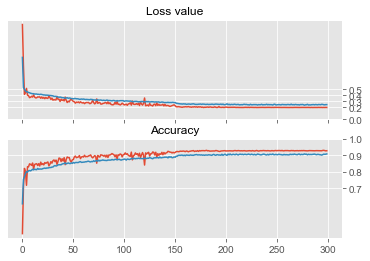

In [24]:
import pandas as pd

records     = pd.read_csv(modelname +'.csv')
plt.figure()
plt.subplot(211)
plt.plot(records['val_loss'])
plt.plot(records['loss'])
plt.yticks([0, 0.20, 0.30, 0.4, 0.5])
plt.title('Loss value',fontsize=12)

ax          = plt.gca()
ax.set_xticklabels([])



plt.subplot(212)
plt.plot(records['val_acc'])
plt.plot(records['acc'])
plt.yticks([0.7, 0.8, 0.9, 1.0])
plt.title('Accuracy',fontsize=12)
plt.show()

In [25]:
wrong_ans_index = []

for i in range(len(predout)):
    if predout[i] != testout[i]:
        wrong_ans_index.append(i)

In [26]:
wrong_ans_index = list(set(wrong_ans_index))

Showing 3155 index image
Predicted as 1 but is actually 0


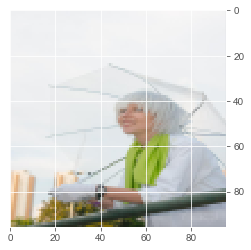

Showing 2051 index image
Predicted as 0 but is actually 1


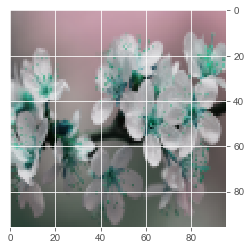

Showing 4 index image
Predicted as 0 but is actually 1


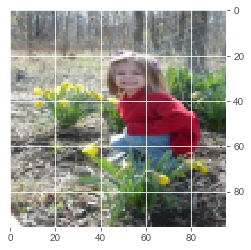

Showing 2053 index image
Predicted as 0 but is actually 1


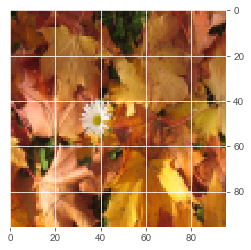

Showing 3080 index image
Predicted as 1 but is actually 0


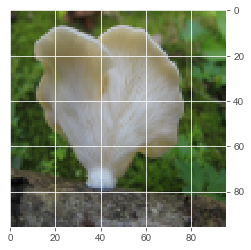

Showing 17 index image
Predicted as 0 but is actually 1


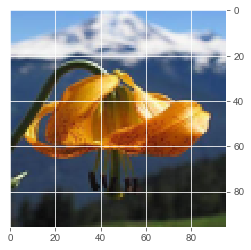

Showing 3603 index image
Predicted as 1 but is actually 0


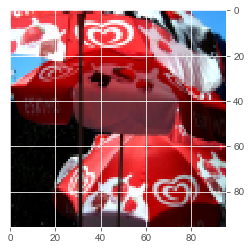

Showing 1557 index image
Predicted as 0 but is actually 1


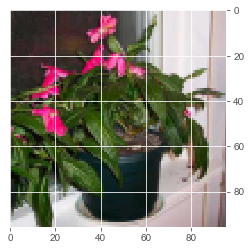

Showing 2583 index image
Predicted as 1 but is actually 0


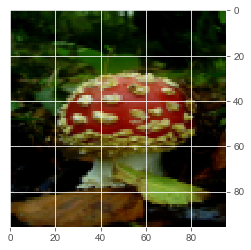

Showing 536 index image
Predicted as 0 but is actually 1


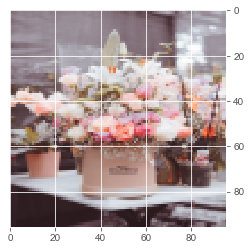

Showing 1049 index image
Predicted as 0 but is actually 1


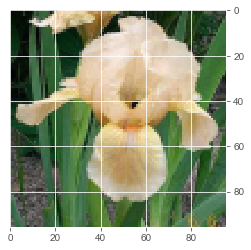

Showing 2584 index image
Predicted as 1 but is actually 0


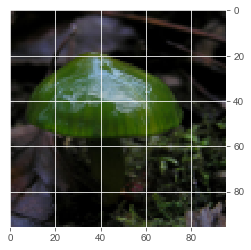

Showing 32 index image
Predicted as 0 but is actually 1


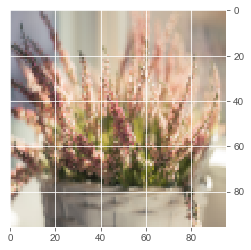

Showing 33 index image
Predicted as 0 but is actually 1


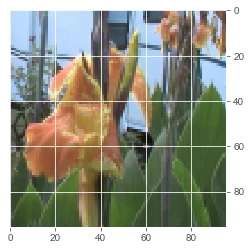

Showing 1572 index image
Predicted as 0 but is actually 1


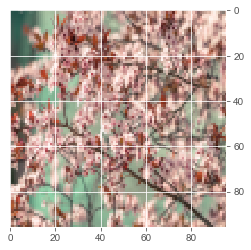

Showing 37 index image
Predicted as 0 but is actually 1


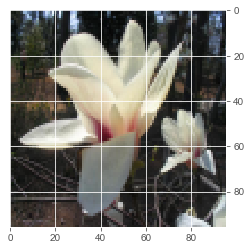

Showing 1065 index image
Predicted as 0 but is actually 1


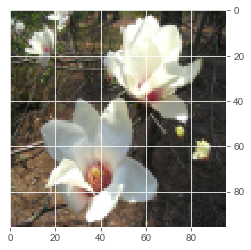

Showing 3625 index image
Predicted as 1 but is actually 0


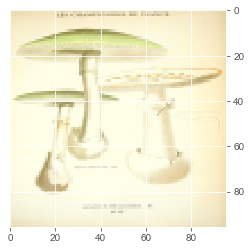

Showing 2094 index image
Predicted as 0 but is actually 1


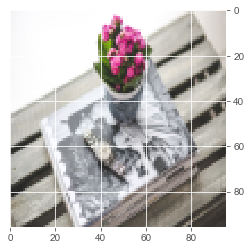

Showing 2606 index image
Predicted as 1 but is actually 0


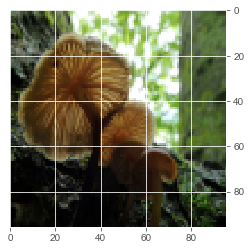

Showing 2610 index image
Predicted as 1 but is actually 0


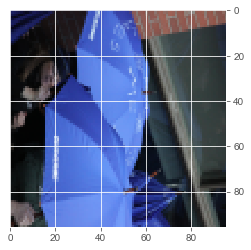

Showing 564 index image
Predicted as 0 but is actually 1


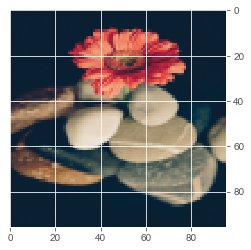

Showing 1079 index image
Predicted as 0 but is actually 1


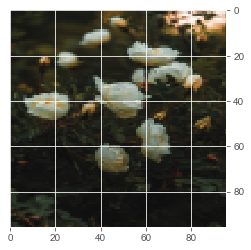

Showing 3645 index image
Predicted as 1 but is actually 0


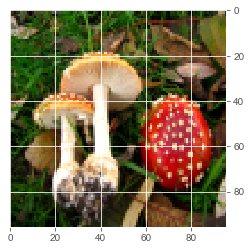

Showing 2111 index image
Predicted as 0 but is actually 1


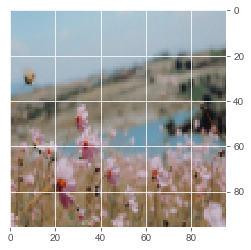

Showing 3136 index image
Predicted as 1 but is actually 0


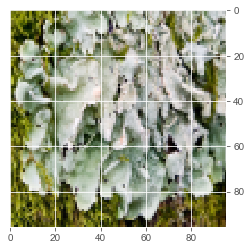

Showing 1603 index image
Predicted as 0 but is actually 1


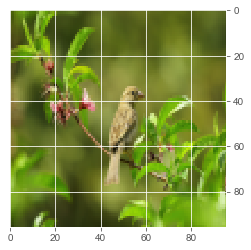

Showing 3140 index image
Predicted as 1 but is actually 0


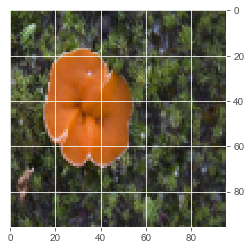

Showing 3141 index image
Predicted as 1 but is actually 0


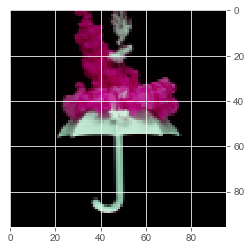

Showing 70 index image
Predicted as 0 but is actually 1


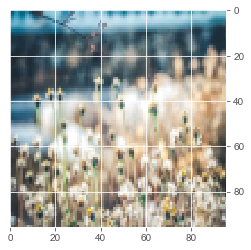

Showing 2632 index image
Predicted as 1 but is actually 0


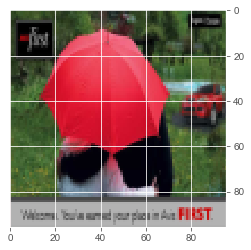

Showing 3656 index image
Predicted as 1 but is actually 0


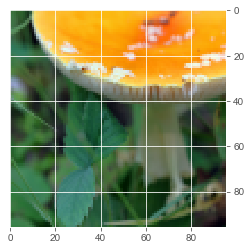

Showing 75 index image
Predicted as 0 but is actually 1


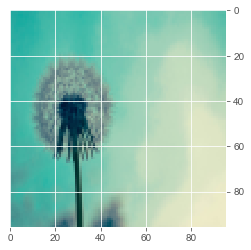

Showing 1616 index image
Predicted as 0 but is actually 1


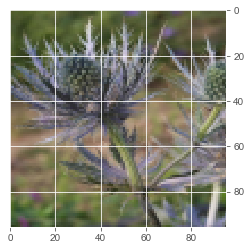

Showing 1618 index image
Predicted as 0 but is actually 1


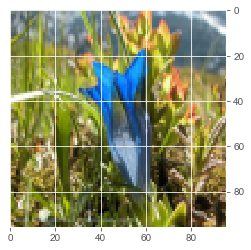

Showing 83 index image
Predicted as 0 but is actually 1


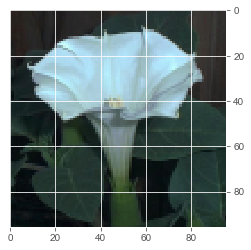

Showing 1619 index image
Predicted as 0 but is actually 1


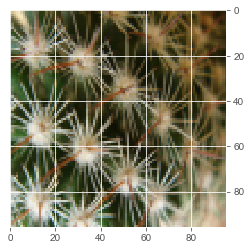

Showing 597 index image
Predicted as 0 but is actually 1


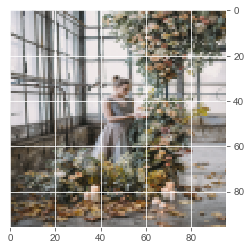

Showing 1109 index image
Predicted as 0 but is actually 1


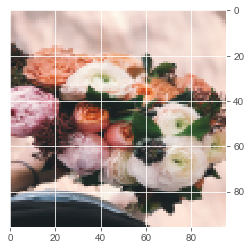

Showing 2132 index image
Predicted as 0 but is actually 1


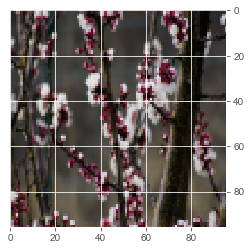

Showing 2134 index image
Predicted as 0 but is actually 1


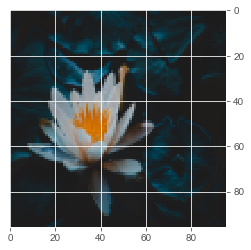

Showing 89 index image
Predicted as 0 but is actually 1


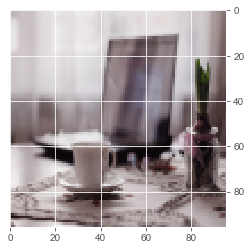

Showing 601 index image
Predicted as 0 but is actually 1


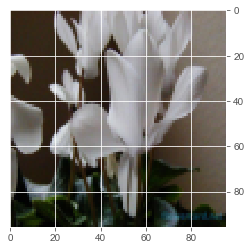

Showing 2135 index image
Predicted as 0 but is actually 1


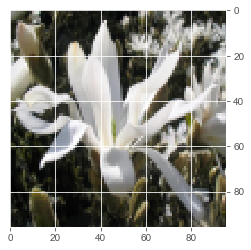

Showing 2651 index image
Predicted as 1 but is actually 0


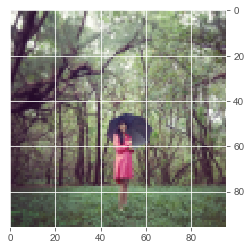

Showing 3668 index image
Predicted as 1 but is actually 0


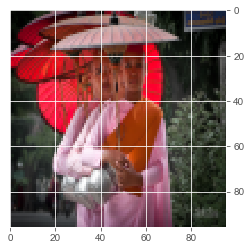

Showing 2656 index image
Predicted as 1 but is actually 0


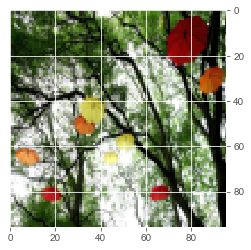

Showing 1121 index image
Predicted as 0 but is actually 1


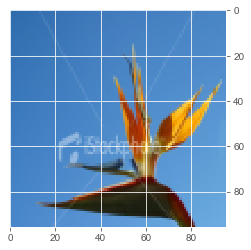

Showing 3680 index image
Predicted as 1 but is actually 0


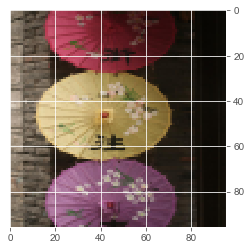

Showing 1642 index image
Predicted as 0 but is actually 1


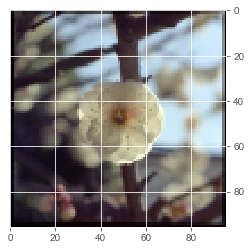

Showing 2668 index image
Predicted as 1 but is actually 0


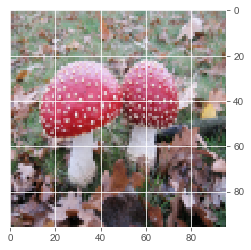

Showing 621 index image
Predicted as 0 but is actually 1


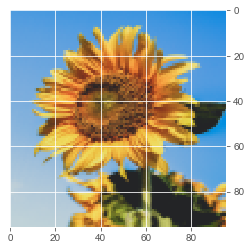

Showing 3183 index image
Predicted as 1 but is actually 0


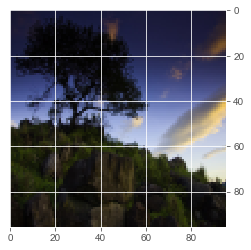

Showing 2164 index image
Predicted as 0 but is actually 1


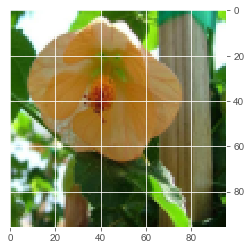

Showing 631 index image
Predicted as 0 but is actually 1


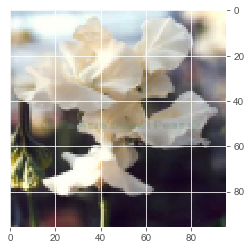

Showing 1145 index image
Predicted as 0 but is actually 1


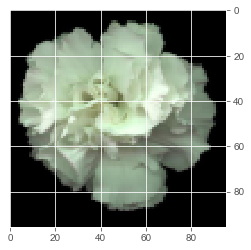

Showing 2683 index image
Predicted as 1 but is actually 0


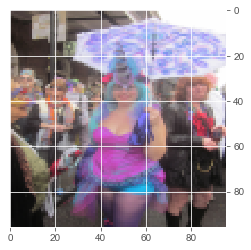

Showing 636 index image
Predicted as 0 but is actually 1


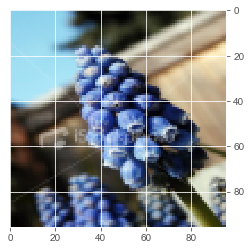

Showing 2172 index image
Predicted as 0 but is actually 1


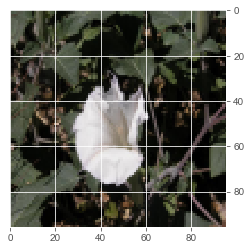

Showing 3196 index image
Predicted as 1 but is actually 0


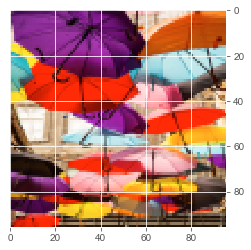

Showing 3197 index image
Predicted as 1 but is actually 0


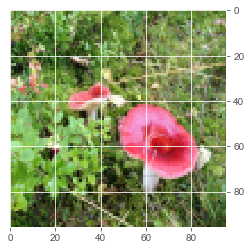

Showing 642 index image
Predicted as 0 but is actually 1


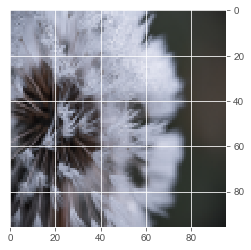

Showing 131 index image
Predicted as 0 but is actually 1


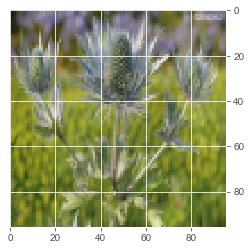

Showing 2691 index image
Predicted as 1 but is actually 0


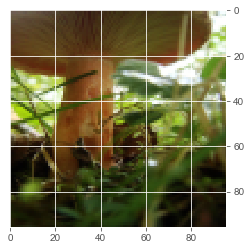

Showing 2181 index image
Predicted as 0 but is actually 1


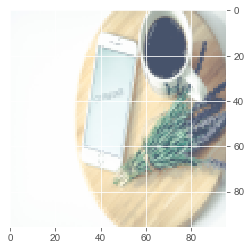

Showing 3203 index image
Predicted as 1 but is actually 0


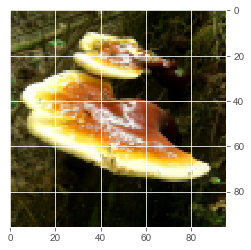

Showing 647 index image
Predicted as 0 but is actually 1


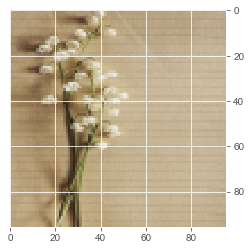

Showing 138 index image
Predicted as 0 but is actually 1


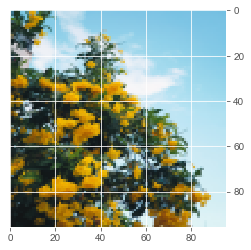

Showing 1165 index image
Predicted as 0 but is actually 1


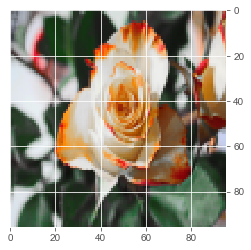

Showing 2189 index image
Predicted as 0 but is actually 1


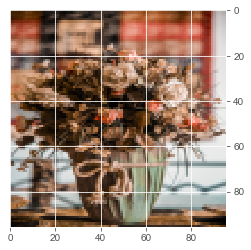

Showing 2190 index image
Predicted as 0 but is actually 1


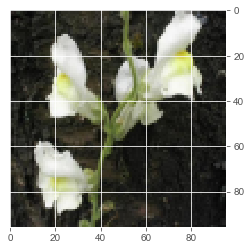

Showing 656 index image
Predicted as 0 but is actually 1


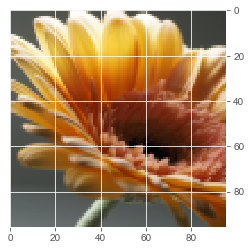

Showing 146 index image
Predicted as 0 but is actually 1


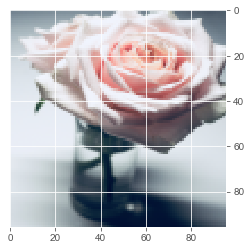

Showing 147 index image
Predicted as 0 but is actually 1


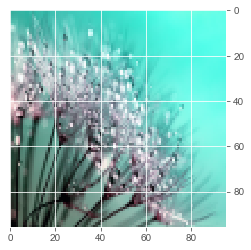

Showing 2195 index image
Predicted as 0 but is actually 1


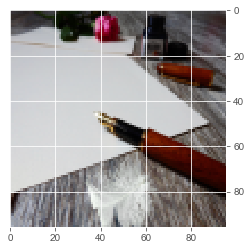

Showing 1175 index image
Predicted as 0 but is actually 1


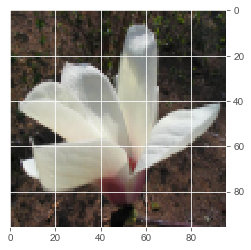

Showing 2199 index image
Predicted as 0 but is actually 1


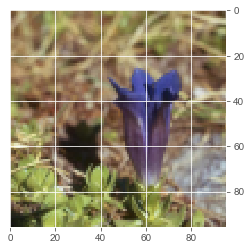

Showing 2713 index image
Predicted as 1 but is actually 0


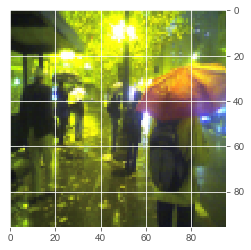

Showing 2714 index image
Predicted as 1 but is actually 0


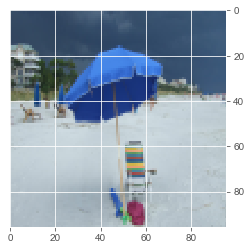

Showing 3224 index image
Predicted as 1 but is actually 0


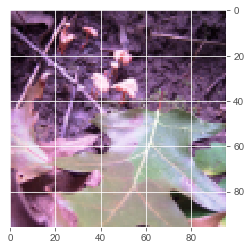

Showing 156 index image
Predicted as 0 but is actually 1


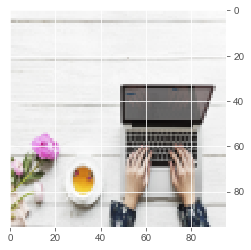

Showing 3226 index image
Predicted as 1 but is actually 0


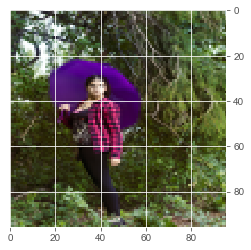

Showing 2725 index image
Predicted as 1 but is actually 0


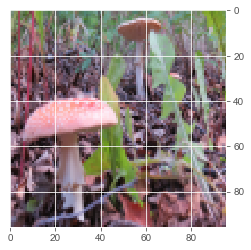

Showing 1704 index image
Predicted as 0 but is actually 1


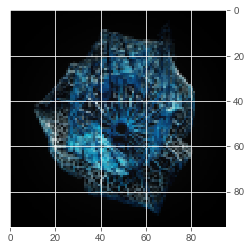

Showing 2216 index image
Predicted as 0 but is actually 1


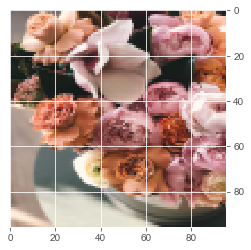

Showing 1706 index image
Predicted as 0 but is actually 1


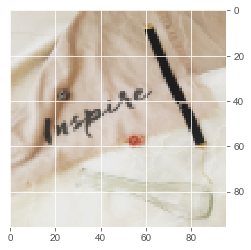

Showing 2221 index image
Predicted as 0 but is actually 1


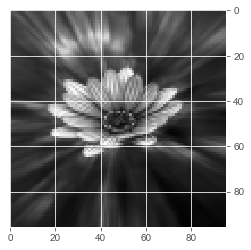

Showing 2743 index image
Predicted as 1 but is actually 0


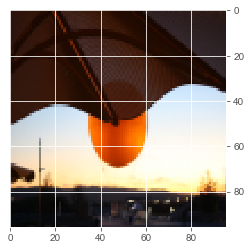

Showing 2749 index image
Predicted as 1 but is actually 0


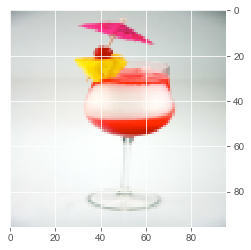

Showing 1731 index image
Predicted as 0 but is actually 1


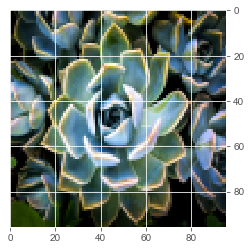

Showing 1221 index image
Predicted as 0 but is actually 1


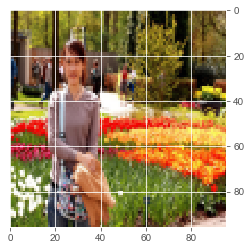

Showing 2246 index image
Predicted as 0 but is actually 1


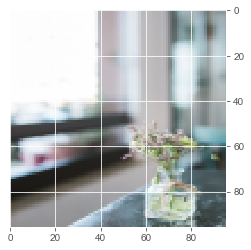

Showing 3271 index image
Predicted as 1 but is actually 0


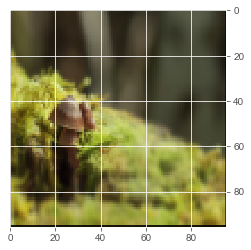

Showing 200 index image
Predicted as 0 but is actually 1


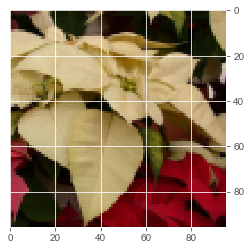

Showing 2248 index image
Predicted as 0 but is actually 1


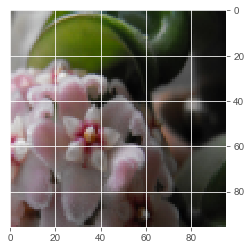

Showing 2249 index image
Predicted as 0 but is actually 1


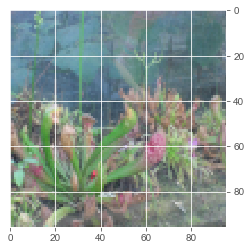

Showing 2763 index image
Predicted as 1 but is actually 0


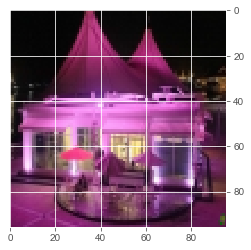

Showing 2770 index image
Predicted as 1 but is actually 0


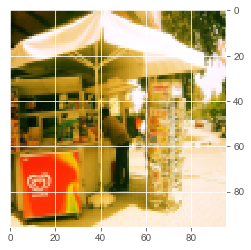

Showing 1235 index image
Predicted as 0 but is actually 1


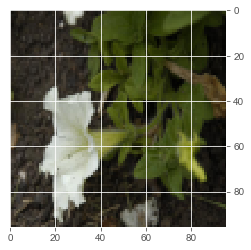

Showing 2772 index image
Predicted as 1 but is actually 0


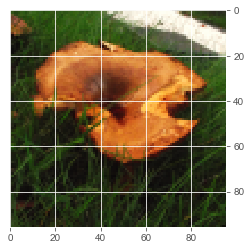

Showing 1756 index image
Predicted as 0 but is actually 1


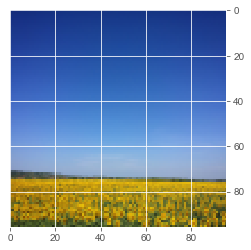

Showing 2781 index image
Predicted as 1 but is actually 0


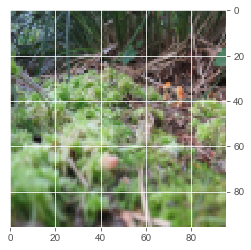

Showing 1247 index image
Predicted as 0 but is actually 1


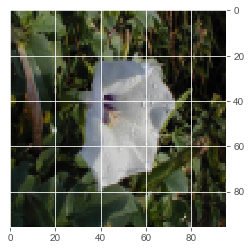

Showing 224 index image
Predicted as 0 but is actually 1


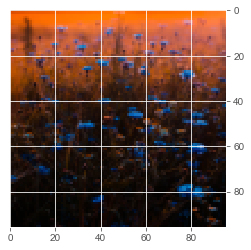

Showing 736 index image
Predicted as 0 but is actually 1


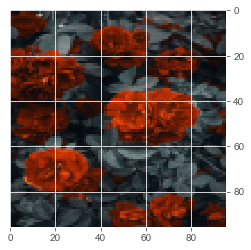

Showing 3297 index image
Predicted as 1 but is actually 0


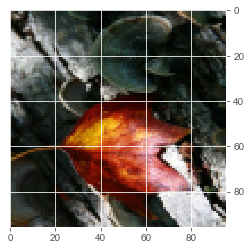

Showing 2789 index image
Predicted as 1 but is actually 0


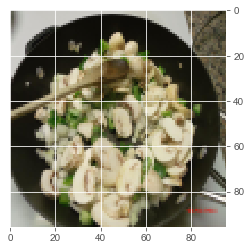

Showing 2793 index image
Predicted as 1 but is actually 0


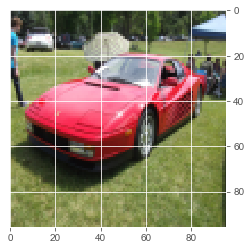

Showing 1259 index image
Predicted as 0 but is actually 1


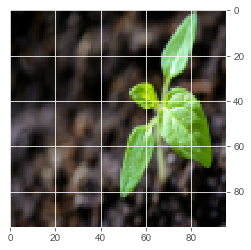

Showing 235 index image
Predicted as 0 but is actually 1


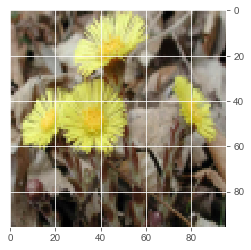

Showing 748 index image
Predicted as 0 but is actually 1


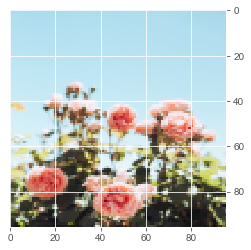

Showing 2283 index image
Predicted as 1 but is actually 0


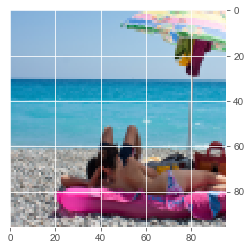

Showing 2285 index image
Predicted as 1 but is actually 0


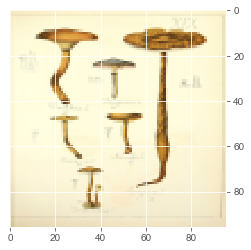

Showing 240 index image
Predicted as 0 but is actually 1


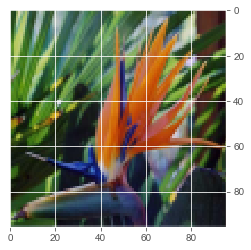

Showing 753 index image
Predicted as 0 but is actually 1


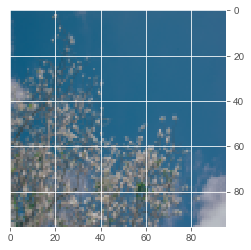

Showing 1264 index image
Predicted as 0 but is actually 1


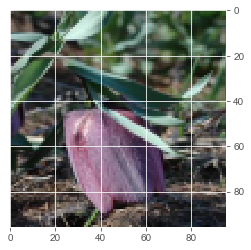

Showing 2803 index image
Predicted as 1 but is actually 0


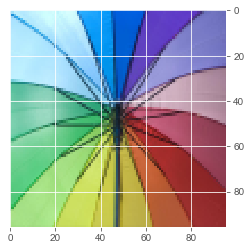

Showing 3310 index image
Predicted as 1 but is actually 0


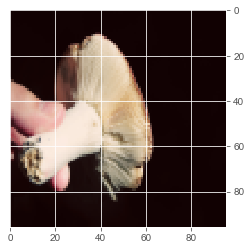

Showing 3316 index image
Predicted as 1 but is actually 0


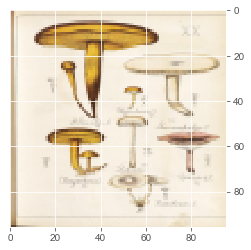

Showing 246 index image
Predicted as 0 but is actually 1


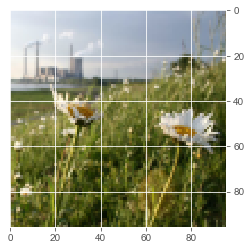

Showing 759 index image
Predicted as 0 but is actually 1


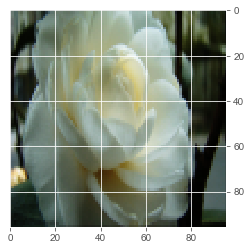

Showing 2297 index image
Predicted as 1 but is actually 0


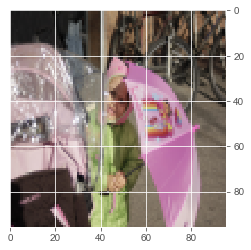

Showing 253 index image
Predicted as 0 but is actually 1


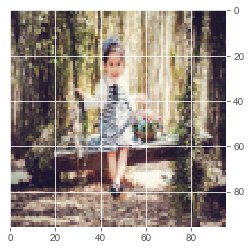

Showing 2302 index image
Predicted as 1 but is actually 0


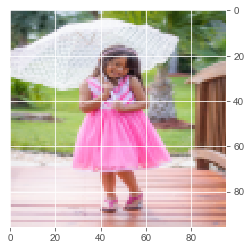

Showing 2819 index image
Predicted as 1 but is actually 0


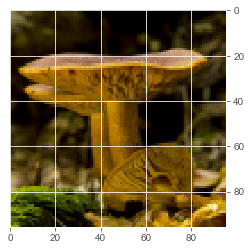

Showing 2821 index image
Predicted as 1 but is actually 0


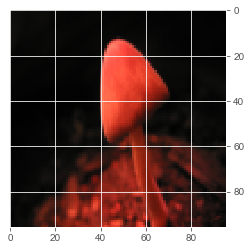

Showing 3513 index image
Predicted as 1 but is actually 0


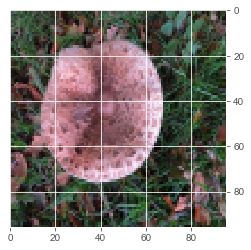

Showing 1804 index image
Predicted as 0 but is actually 1


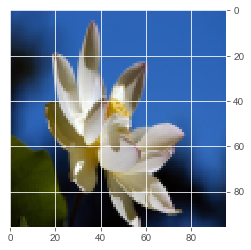

Showing 270 index image
Predicted as 0 but is actually 1


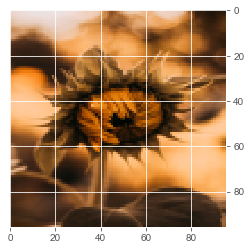

Showing 1294 index image
Predicted as 0 but is actually 1


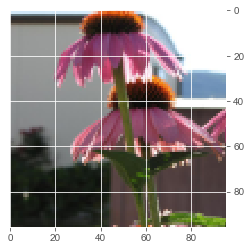

Showing 1807 index image
Predicted as 0 but is actually 1


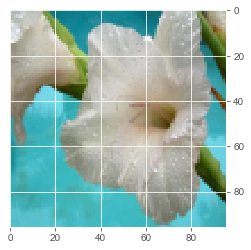

Showing 1808 index image
Predicted as 0 but is actually 1


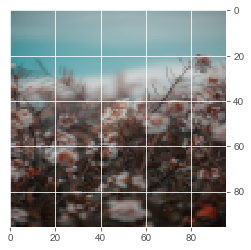

Showing 1298 index image
Predicted as 0 but is actually 1


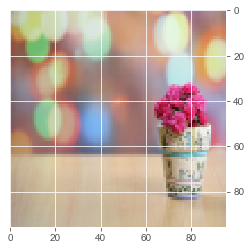

Showing 281 index image
Predicted as 0 but is actually 1


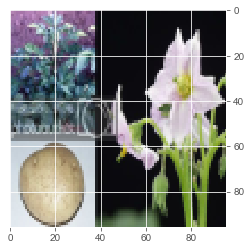

Showing 795 index image
Predicted as 0 but is actually 1


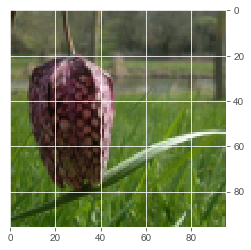

Showing 3356 index image
Predicted as 1 but is actually 0


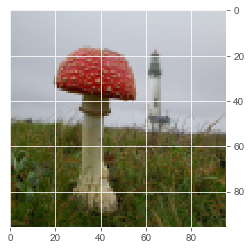

Showing 1823 index image
Predicted as 0 but is actually 1


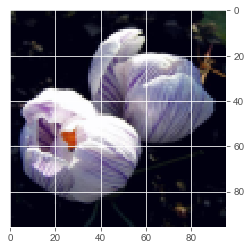

Showing 1824 index image
Predicted as 0 but is actually 1


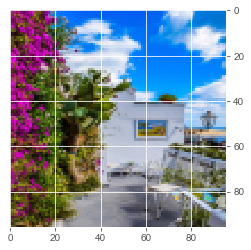

Showing 2337 index image
Predicted as 1 but is actually 0


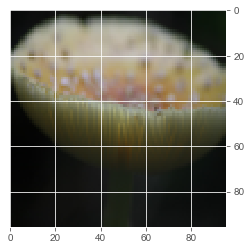

Showing 2852 index image
Predicted as 1 but is actually 0


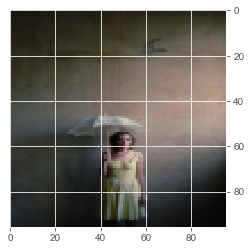

Showing 2343 index image
Predicted as 1 but is actually 0


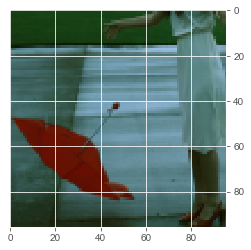

Showing 2858 index image
Predicted as 1 but is actually 0


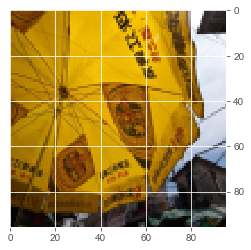

Showing 3371 index image
Predicted as 1 but is actually 0


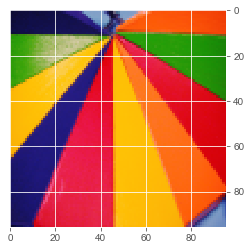

Showing 1836 index image
Predicted as 0 but is actually 1


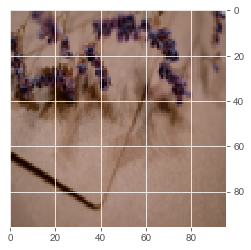

Showing 1325 index image
Predicted as 0 but is actually 1


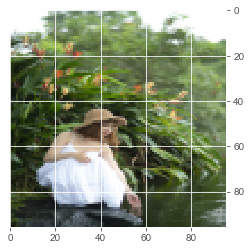

Showing 2349 index image
Predicted as 1 but is actually 0


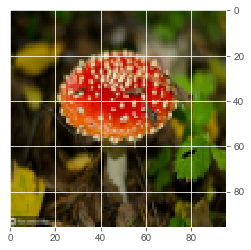

Showing 1329 index image
Predicted as 0 but is actually 1


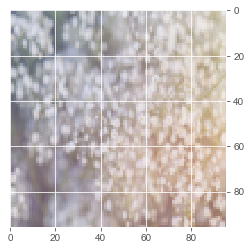

Showing 820 index image
Predicted as 0 but is actually 1


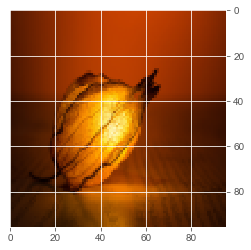

Showing 1845 index image
Predicted as 0 but is actually 1


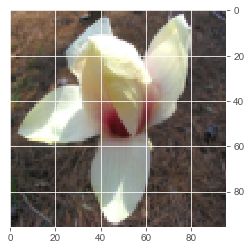

Showing 3521 index image
Predicted as 1 but is actually 0


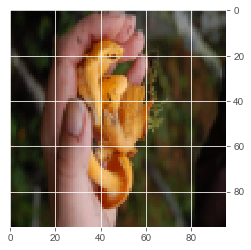

Showing 312 index image
Predicted as 0 but is actually 1


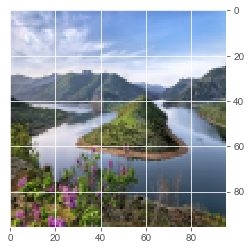

Showing 2873 index image
Predicted as 1 but is actually 0


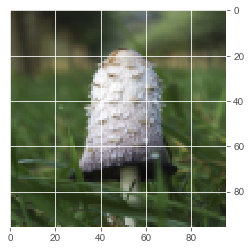

Showing 827 index image
Predicted as 0 but is actually 1


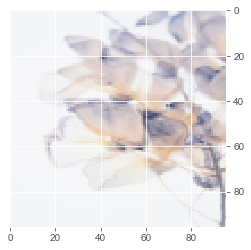

Showing 1340 index image
Predicted as 0 but is actually 1


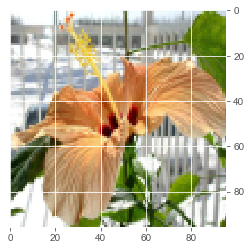

Showing 2875 index image
Predicted as 1 but is actually 0


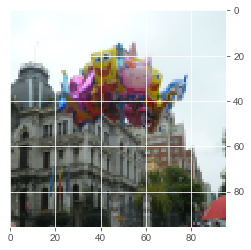

Showing 1854 index image
Predicted as 0 but is actually 1


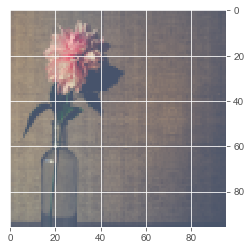

Showing 2876 index image
Predicted as 1 but is actually 0


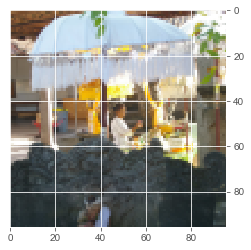

Showing 836 index image
Predicted as 0 but is actually 1


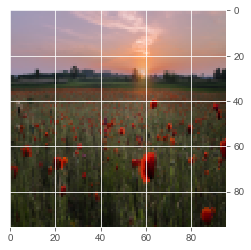

Showing 1861 index image
Predicted as 0 but is actually 1


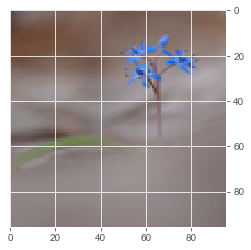

Showing 1351 index image
Predicted as 0 but is actually 1


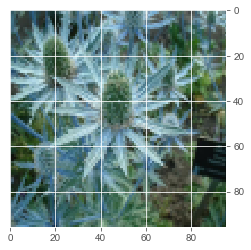

Showing 2375 index image
Predicted as 1 but is actually 0


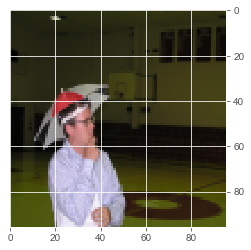

Showing 329 index image
Predicted as 0 but is actually 1


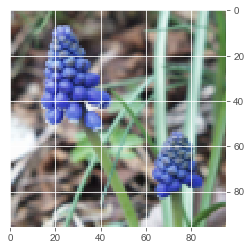

Showing 2376 index image
Predicted as 1 but is actually 0


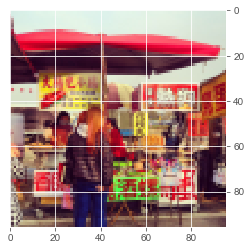

Showing 1355 index image
Predicted as 0 but is actually 1


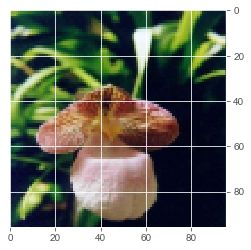

Showing 1868 index image
Predicted as 0 but is actually 1


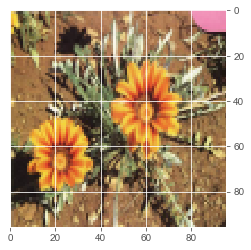

Showing 3400 index image
Predicted as 1 but is actually 0


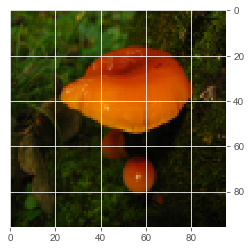

Showing 2384 index image
Predicted as 1 but is actually 0


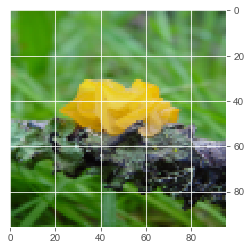

Showing 3410 index image
Predicted as 1 but is actually 0


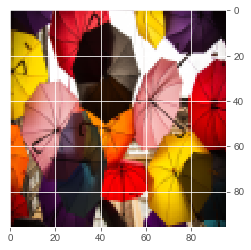

Showing 854 index image
Predicted as 0 but is actually 1


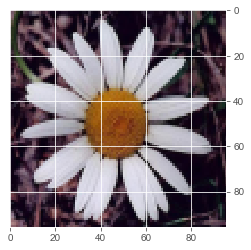

Showing 2390 index image
Predicted as 1 but is actually 0


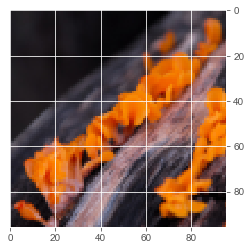

Showing 2903 index image
Predicted as 1 but is actually 0


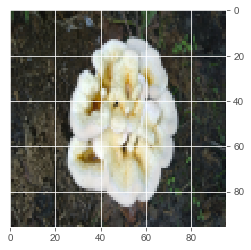

Showing 3415 index image
Predicted as 1 but is actually 0


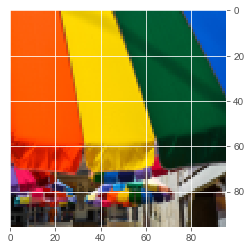

Showing 1371 index image
Predicted as 0 but is actually 1


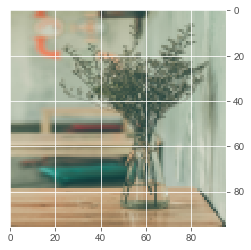

Showing 3419 index image
Predicted as 1 but is actually 0


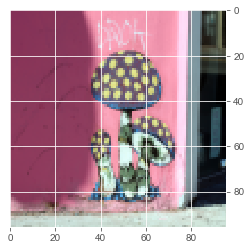

Showing 2909 index image
Predicted as 1 but is actually 0


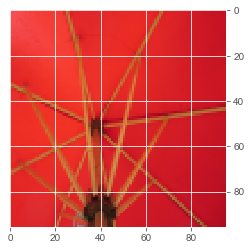

Showing 2398 index image
Predicted as 1 but is actually 0


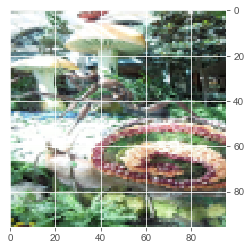

Showing 863 index image
Predicted as 0 but is actually 1


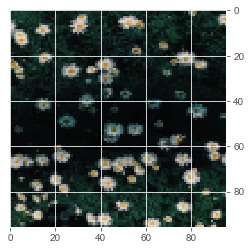

Showing 2399 index image
Predicted as 1 but is actually 0


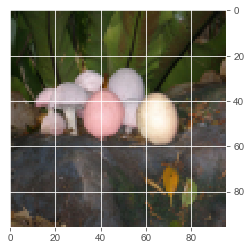

Showing 2400 index image
Predicted as 1 but is actually 0


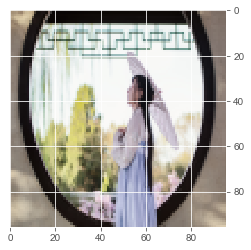

Showing 2914 index image
Predicted as 1 but is actually 0


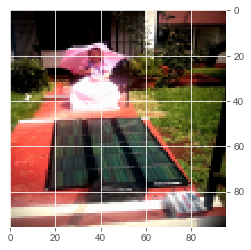

Showing 1382 index image
Predicted as 0 but is actually 1


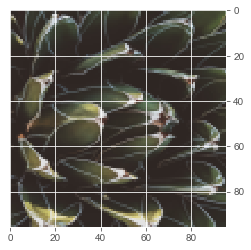

Showing 2407 index image
Predicted as 1 but is actually 0


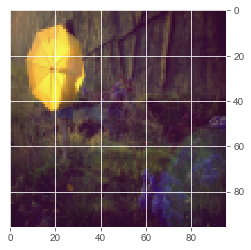

Showing 2408 index image
Predicted as 1 but is actually 0


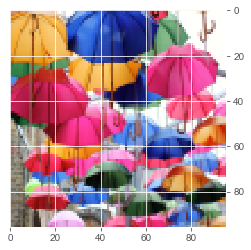

Showing 876 index image
Predicted as 0 but is actually 1


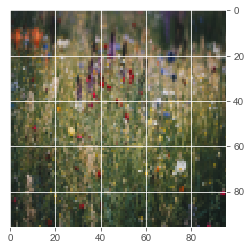

Showing 1902 index image
Predicted as 0 but is actually 1


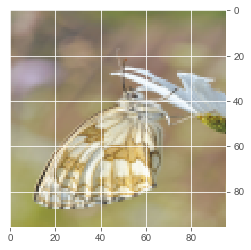

Showing 367 index image
Predicted as 0 but is actually 1


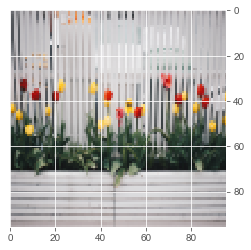

Showing 1394 index image
Predicted as 0 but is actually 1


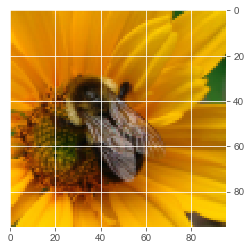

Showing 1397 index image
Predicted as 0 but is actually 1


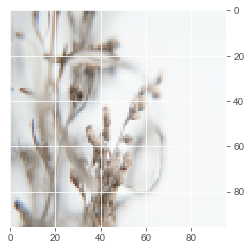

Showing 376 index image
Predicted as 0 but is actually 1


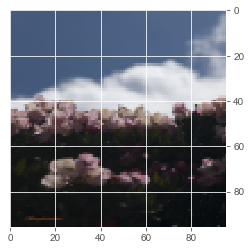

Showing 2426 index image
Predicted as 1 but is actually 0


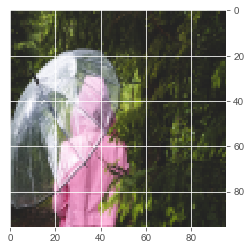

Showing 2432 index image
Predicted as 1 but is actually 0


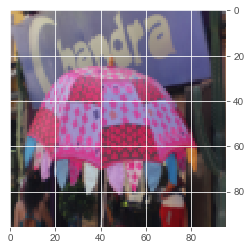

Showing 2947 index image
Predicted as 1 but is actually 0


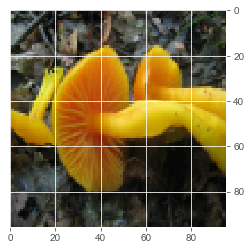

Showing 2436 index image
Predicted as 1 but is actually 0


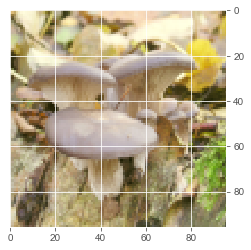

Showing 2441 index image
Predicted as 1 but is actually 0


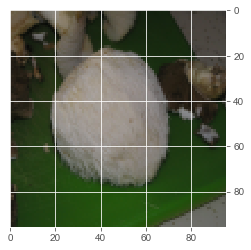

Showing 394 index image
Predicted as 0 but is actually 1


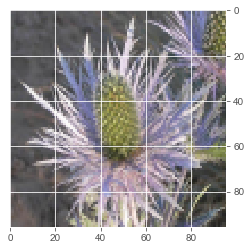

Showing 1931 index image
Predicted as 0 but is actually 1


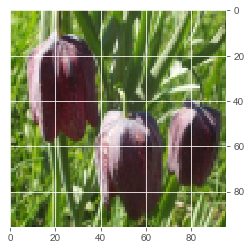

Showing 2442 index image
Predicted as 1 but is actually 0


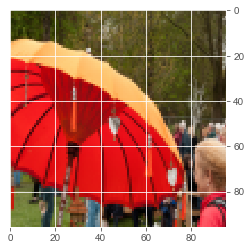

Showing 3467 index image
Predicted as 1 but is actually 0


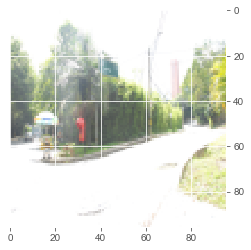

Showing 910 index image
Predicted as 0 but is actually 1


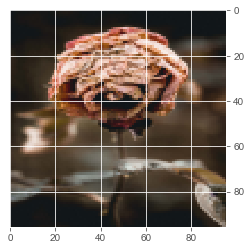

Showing 1424 index image
Predicted as 0 but is actually 1


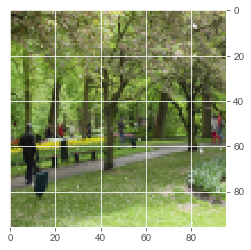

Showing 1426 index image
Predicted as 0 but is actually 1


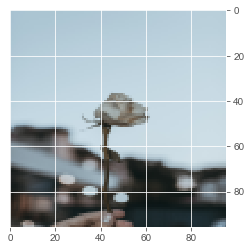

Showing 1946 index image
Predicted as 0 but is actually 1


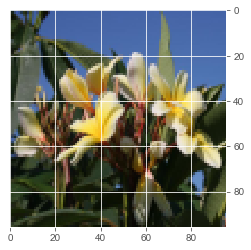

Showing 927 index image
Predicted as 0 but is actually 1


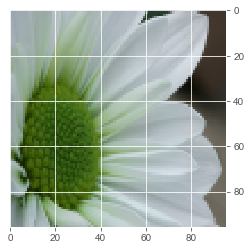

Showing 416 index image
Predicted as 0 but is actually 1


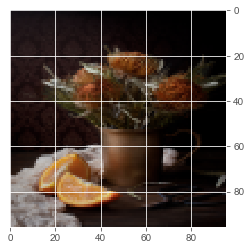

Showing 1955 index image
Predicted as 0 but is actually 1


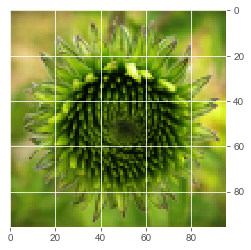

Showing 3493 index image
Predicted as 1 but is actually 0


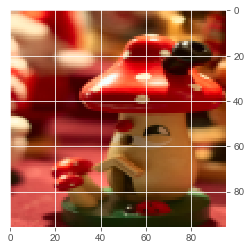

Showing 3494 index image
Predicted as 1 but is actually 0


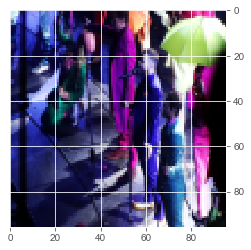

Showing 935 index image
Predicted as 0 but is actually 1


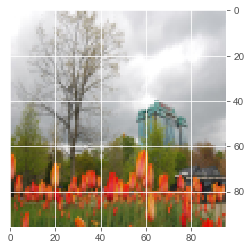

Showing 1963 index image
Predicted as 0 but is actually 1


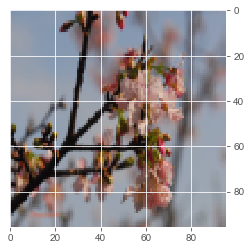

Showing 1454 index image
Predicted as 0 but is actually 1


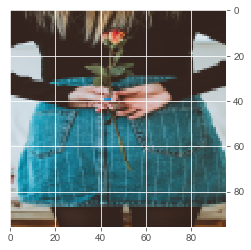

Showing 1967 index image
Predicted as 0 but is actually 1


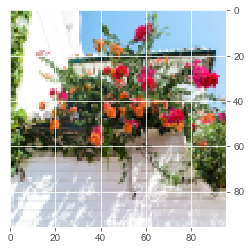

Showing 2481 index image
Predicted as 1 but is actually 0


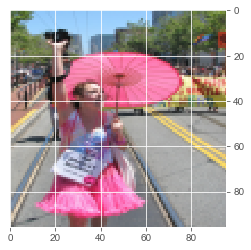

Showing 947 index image
Predicted as 0 but is actually 1


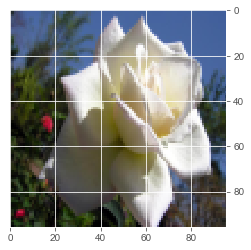

Showing 2483 index image
Predicted as 1 but is actually 0


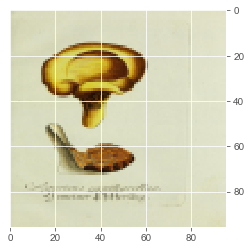

Showing 950 index image
Predicted as 0 but is actually 1


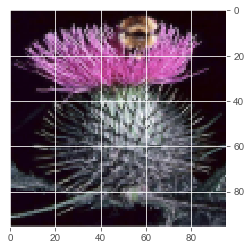

Showing 1463 index image
Predicted as 0 but is actually 1


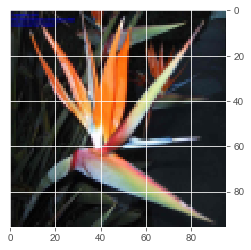

Showing 440 index image
Predicted as 0 but is actually 1


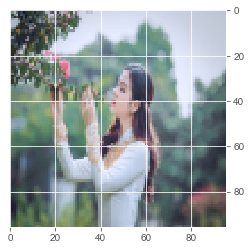

Showing 2486 index image
Predicted as 1 but is actually 0


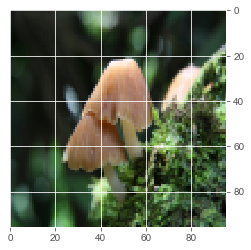

Showing 954 index image
Predicted as 0 but is actually 1


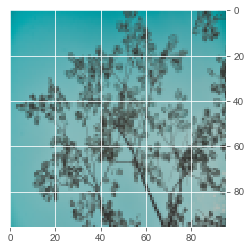

Showing 1466 index image
Predicted as 0 but is actually 1


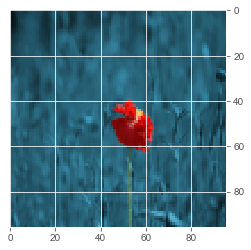

Showing 1978 index image
Predicted as 0 but is actually 1


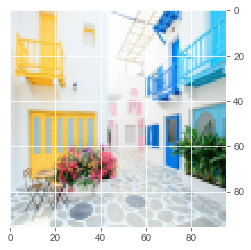

Showing 1469 index image
Predicted as 0 but is actually 1


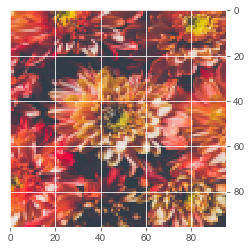

Showing 958 index image
Predicted as 0 but is actually 1


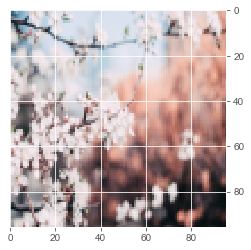

Showing 1470 index image
Predicted as 0 but is actually 1


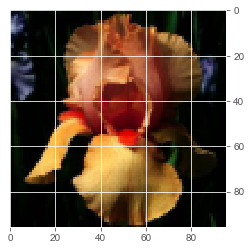

Showing 448 index image
Predicted as 0 but is actually 1


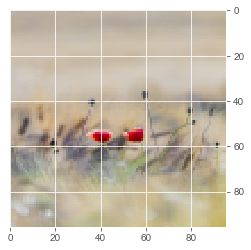

Showing 1472 index image
Predicted as 0 but is actually 1


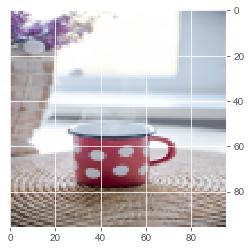

Showing 962 index image
Predicted as 0 but is actually 1


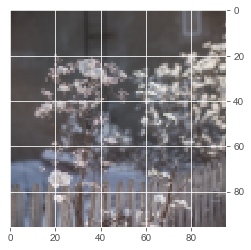

Showing 1981 index image
Predicted as 0 but is actually 1


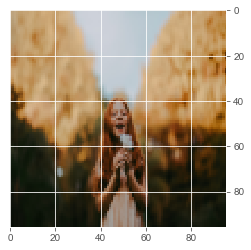

Showing 1986 index image
Predicted as 0 but is actually 1


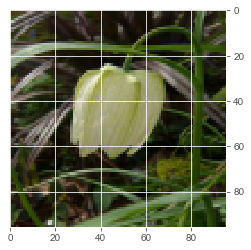

Showing 1988 index image
Predicted as 0 but is actually 1


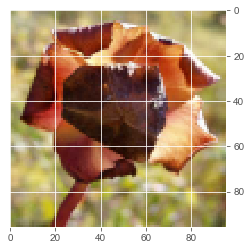

Showing 2498 index image
Predicted as 1 but is actually 0


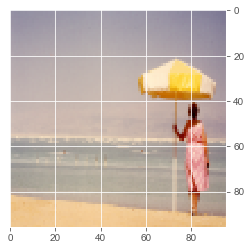

Showing 455 index image
Predicted as 0 but is actually 1


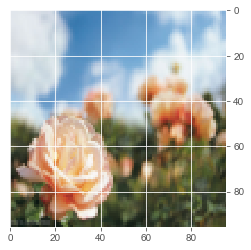

Showing 456 index image
Predicted as 0 but is actually 1


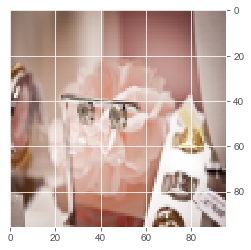

Showing 457 index image
Predicted as 0 but is actually 1


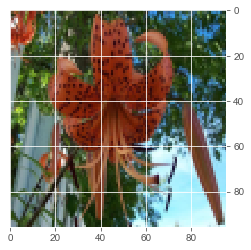

Showing 1480 index image
Predicted as 0 but is actually 1


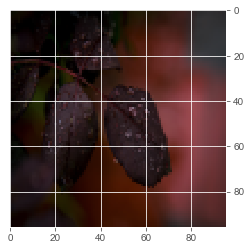

Showing 2505 index image
Predicted as 1 but is actually 0


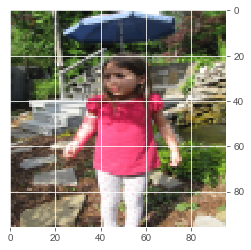

Showing 3017 index image
Predicted as 1 but is actually 0


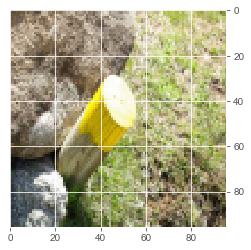

Showing 1486 index image
Predicted as 0 but is actually 1


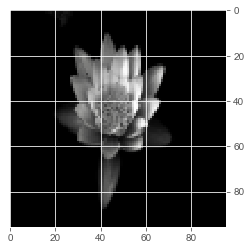

Showing 463 index image
Predicted as 0 but is actually 1


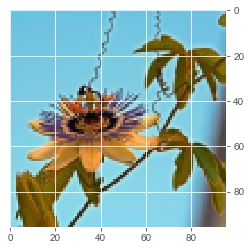

Showing 1489 index image
Predicted as 0 but is actually 1


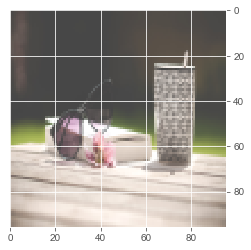

Showing 1493 index image
Predicted as 0 but is actually 1


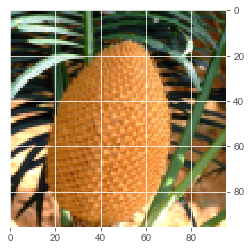

Showing 3033 index image
Predicted as 1 but is actually 0


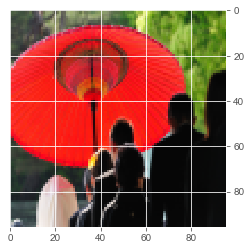

Showing 986 index image
Predicted as 0 but is actually 1


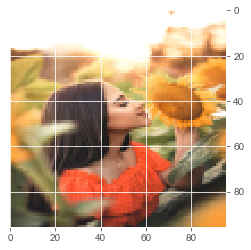

Showing 3044 index image
Predicted as 1 but is actually 0


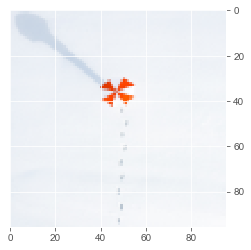

Showing 486 index image
Predicted as 0 but is actually 1


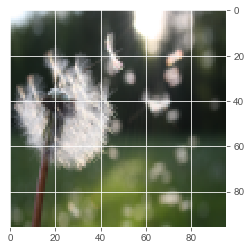

Showing 2025 index image
Predicted as 0 but is actually 1


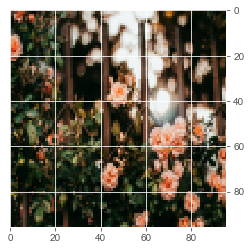

Showing 2029 index image
Predicted as 0 but is actually 1


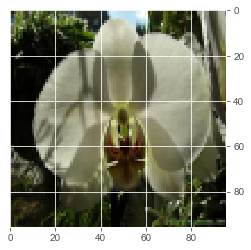

Showing 495 index image
Predicted as 0 but is actually 1


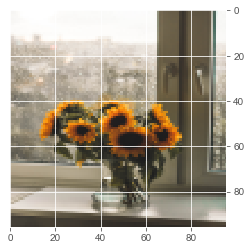

Showing 3567 index image
Predicted as 1 but is actually 0


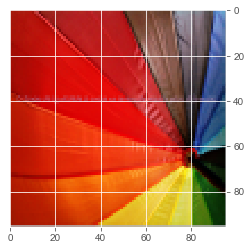

Showing 1010 index image
Predicted as 0 but is actually 1


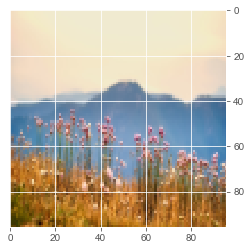

Showing 1523 index image
Predicted as 0 but is actually 1


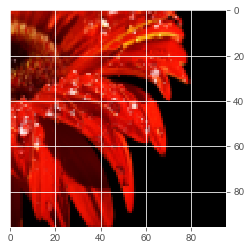

Showing 3058 index image
Predicted as 1 but is actually 0


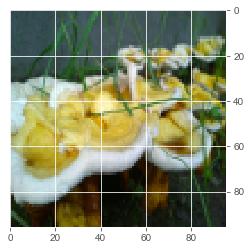

Showing 1525 index image
Predicted as 0 but is actually 1


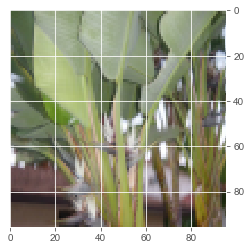

Showing 2549 index image
Predicted as 1 but is actually 0


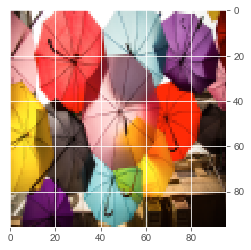

Showing 1020 index image
Predicted as 0 but is actually 1


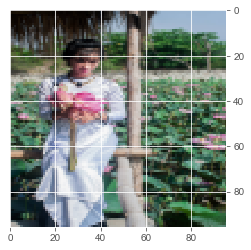

Showing 510 index image
Predicted as 0 but is actually 1


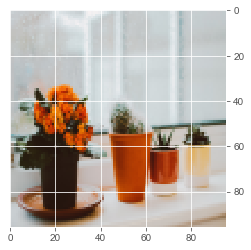

In [27]:
# Randomly show X examples of that was wrong

dataset = tsDatOrg #flowers #fungus #rocks

for index in wrong_ans_index:
    #index = wrong_ans_index[random.randint(0, len(wrong_ans_index)-1)]
    print("Showing %s index image" %(index))
    print("Predicted as %s but is actually %s" %(predout[index], testout[index]))
    imgplot = plt.imshow(data[index])
    plt.show()

In [ ]:
# Stacking 3 NNs?